In [26]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib.ticker as mtick

plt.style.use("seaborn-v0_8-whitegrid")

plt.rcParams.update({
    "figure.figsize": (12,6),
    "axes.titlesize": 16,
    "axes.labelsize": 12,
    "xtick.labelsize": 10,
    "ytick.labelsize": 10
})


In [27]:
base = pd.read_csv("/home/labneurofisica/Documents/Códigos/Data/Business Intelligence/Mini Project BI - Equal BI/Raw Data/Read Data/base.csv", sep=",")
mensal = pd.read_csv("/home/labneurofisica/Documents/Códigos/Data/Business Intelligence/Mini Project BI - Equal BI/Raw Data/Transformed Data/mensal.csv", sep=",")
filial_mensal = pd.read_csv("/home/labneurofisica/Documents/Códigos/Data/Business Intelligence/Mini Project BI - Equal BI/Raw Data/Transformed Data/filial_mensal.csv", sep=",")
resumo_filial = pd.read_csv("/home/labneurofisica/Documents/Códigos/Data/Business Intelligence/Mini Project BI - Equal BI/Raw Data/Transformed Data/resumo_filial.csv", sep=",")
resumo_vendedor = pd.read_csv("/home/labneurofisica/Documents/Códigos/Data/Business Intelligence/Mini Project BI - Equal BI/Raw Data/Transformed Data/resumo_vendedor.csv", sep=",")
familia_resumo = pd.read_csv("/home/labneurofisica/Documents/Códigos/Data/Business Intelligence/Mini Project BI - Equal BI/Raw Data/Transformed Data/familia_resumo.csv", sep=",")
top2_familias = pd.read_csv("/home/labneurofisica/Documents/Códigos/Data/Business Intelligence/Mini Project BI - Equal BI/Raw Data/Transformed Data/top2_familias.csv", sep=",")
familia_receita = pd.read_csv("/home/labneurofisica/Documents/Códigos/Data/Business Intelligence/Mini Project BI - Equal BI/Raw Data/Transformed Data/familia_receita.csv", sep=",")
top5_produtos_familia = pd.read_csv("/home/labneurofisica/Documents/Códigos/Data/Business Intelligence/Mini Project BI - Equal BI/Raw Data/Transformed Data/top5_produtos_familia.csv", sep=",")
top5_dependencia = pd.read_csv("/home/labneurofisica/Documents/Códigos/Data/Business Intelligence/Mini Project BI - Equal BI/Raw Data/Transformed Data/top5_dependencia.csv", sep=",")
top1_produto_familia = pd.read_csv("/home/labneurofisica/Documents/Códigos/Data/Business Intelligence/Mini Project BI - Equal BI/Raw Data/Transformed Data/top1_produto_familia.csv", sep=",")
coocorrencia_df = pd.read_csv("/home/labneurofisica/Documents/Códigos/Data/Business Intelligence/Mini Project BI - Equal BI/Raw Data/Transformed Data/coocorrencia_familias.csv", sep=",")
lift = pd.read_csv("/home/labneurofisica/Documents/Códigos/Data/Business Intelligence/Mini Project BI - Equal BI/Raw Data/Transformed Data/lift_familias.csv", sep=",")
lift_filtrado = pd.read_csv("/home/labneurofisica/Documents/Códigos/Data/Business Intelligence/Mini Project BI - Equal BI/Raw Data/Transformed Data/lift_filtrado_familias.csv", sep=",")

/tmp/ipykernel_7731/1036635687.py:1: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  base = pd.read_csv("/home/labneurofisica/Documents/Códigos/Data/Business Intelligence/Mini Project BI - Equal BI/Raw Data/Read Data/base.csv", sep=",")


In [28]:
print(base.columns)
print(mensal.columns)
print(filial_mensal.columns)
print(resumo_filial.columns)
print(resumo_vendedor.columns)
print(familia_resumo.columns)
print(top2_familias.columns)
print(familia_receita.columns)
print(top5_produtos_familia.columns)
print(top5_dependencia.columns)
print(top1_produto_familia.columns)
print(coocorrencia_df.columns)
print(lift.columns)
print(lift_filtrado.columns)

Index(['codigo_contrato', 'data_venda', 'codigo_produto', 'filial_venda',
       'quantidade', 'valor_monetario_total', 'valor_desconto',
       'codigo_vendedor', 'codigo_cliente', 'descricaoproduto',
       'codigo_familia', 'preco_venda_unitario', 'custo_produto_unitario',
       '_categoria_grupo', 'descricaofamilia', 'nome_vendedor',
       'faturamento_bruto', 'custo_total', 'lucro', 'percentual_desconto',
       'ano_mes'],
      dtype='object')
Index(['ano_mes', 'valor_monetario_total', 'faturamento_bruto',
       'valor_desconto', 'lucro', 'percentual_desconto'],
      dtype='object')
Index(['ano_mes', 'filial_venda', 'receita_liquida', 'lucro',
       'clientes_distintos', 'ticket_medio'],
      dtype='object')
Index(['filial_venda', 'receita_total', 'lucro', 'clientes_unicos',
       'ticket_medio', 'lucro_por_cliente'],
      dtype='object')
Index(['codigo_vendedor', 'valor_monetario_total', 'lucro', 'valor_desconto',
       'faturamento_bruto', 'percentual_desconto_medio',

In [29]:
mensal


,ano_mes,valor_monetario_total,faturamento_bruto,valor_desconto,lucro,percentual_desconto
0,2025-01,2068433.21,2080724.92,12291.71,973288.72,0.005907
1,2025-02,1984805.47,1995686.70,10881.23,951019.67,0.005452
2,2025-03,2500046.73,2513746.78,13700.05,1179940.56,0.005450
3,2025-04,2555914.01,2567400.23,11486.22,1236854.18,0.004474
4,2025-05,2848868.83,2862549.20,13680.37,1401366.98,0.004779
5,2025-06,2253833.46,2266659.82,12826.36,1106989.87,0.005659
6,2025-07,2648345.61,2660613.04,12267.43,1295629.27,0.004611
7,2025-08,2592072.64,2604035.94,11963.30,1285197.03,0.004594
8,2025-09,2855709.66,2868227.56,12517.90,1404124.60,0.004364
9,2025-10,2704011.22,2715868.04,11856.82,1331013.33,0.004366


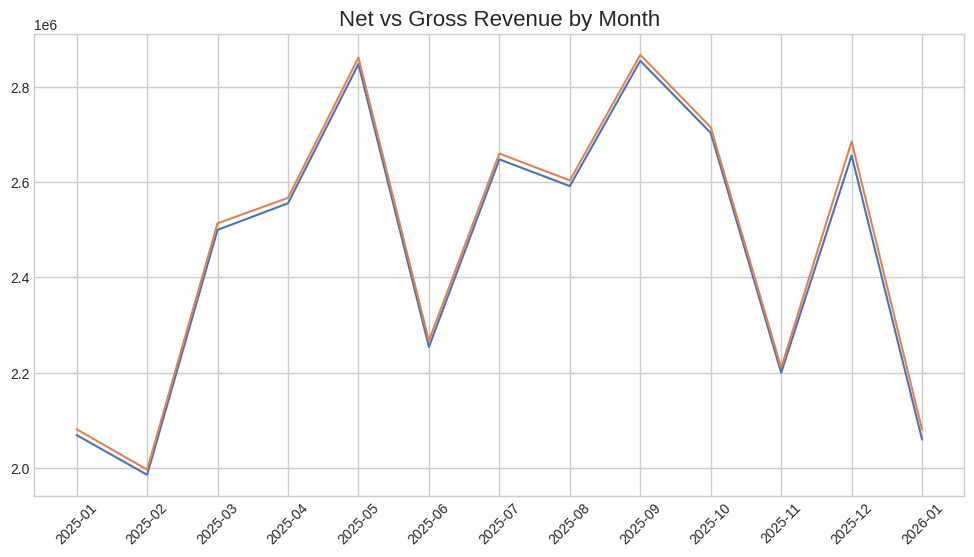

In [30]:
plt.figure(figsize=(12,6))
plt.plot(mensal['ano_mes'], mensal['valor_monetario_total'])
plt.plot(mensal['ano_mes'], mensal['faturamento_bruto'])
plt.xticks(rotation=45)
plt.title("Net vs Gross Revenue by Month")
plt.show()

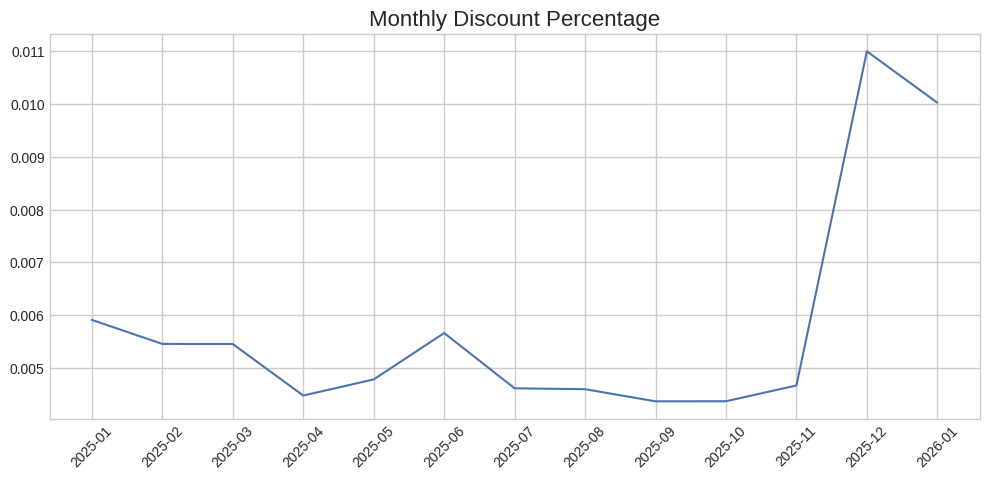

In [31]:
plt.figure(figsize=(12,5))
plt.plot(mensal['ano_mes'], mensal['percentual_desconto'])
plt.xticks(rotation=45)
plt.title("Monthly Discount Percentage")
plt.show()

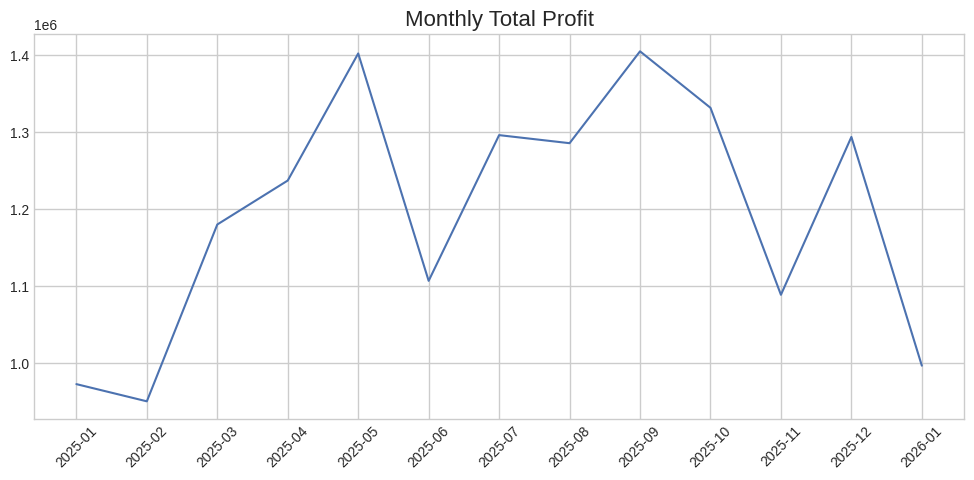

In [32]:
plt.figure(figsize=(12,5))
plt.plot(mensal['ano_mes'], mensal['lucro'])
plt.xticks(rotation=45)
plt.title("Monthly Total Profit")
plt.show()


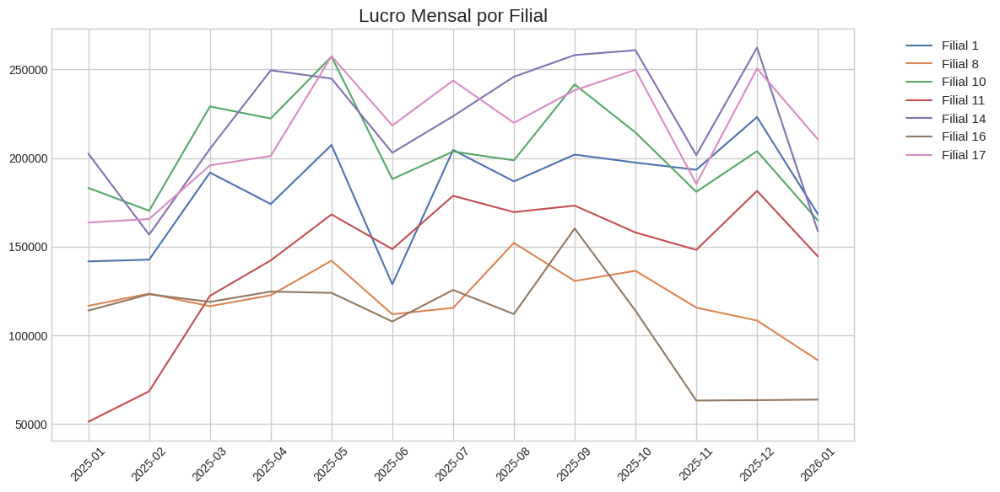

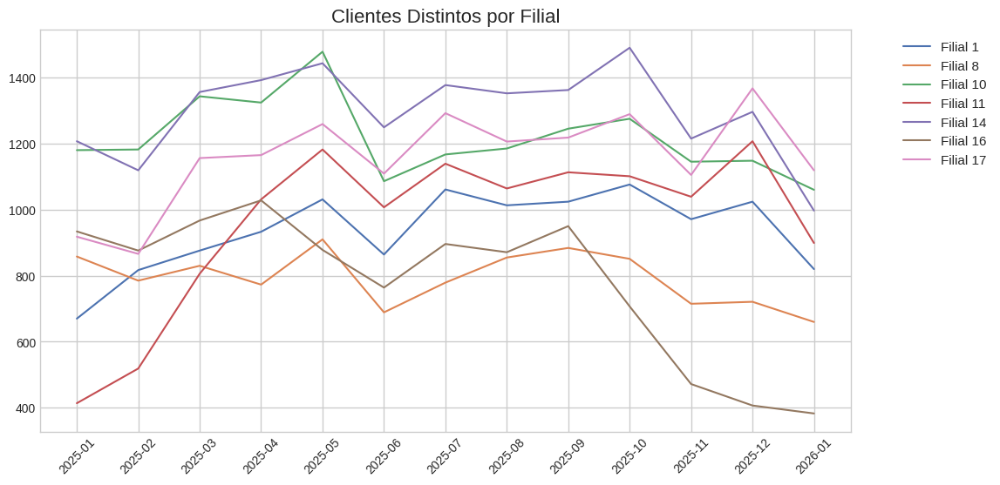

In [33]:
plt.figure(figsize=(12,6))

for filial in filial_mensal["filial_venda"].unique():
    dados = filial_mensal[filial_mensal["filial_venda"] == filial]
    plt.plot(dados["ano_mes"], dados["lucro"], label=f"Filial {filial}")

plt.xticks(rotation=45)
plt.title("Lucro Mensal por Filial")
plt.legend(bbox_to_anchor=(1.05, 1))
plt.tight_layout()
plt.show()

plt.figure(figsize=(12,6))

for filial in filial_mensal["filial_venda"].unique():
    dados = filial_mensal[filial_mensal["filial_venda"] == filial]
    plt.plot(dados["ano_mes"], dados["clientes_distintos"], label=f"Filial {filial}")

plt.xticks(rotation=45)
plt.title("Clientes Distintos por Filial")
plt.legend(bbox_to_anchor=(1.05, 1))
#plt.tight_layout()
plt.show()



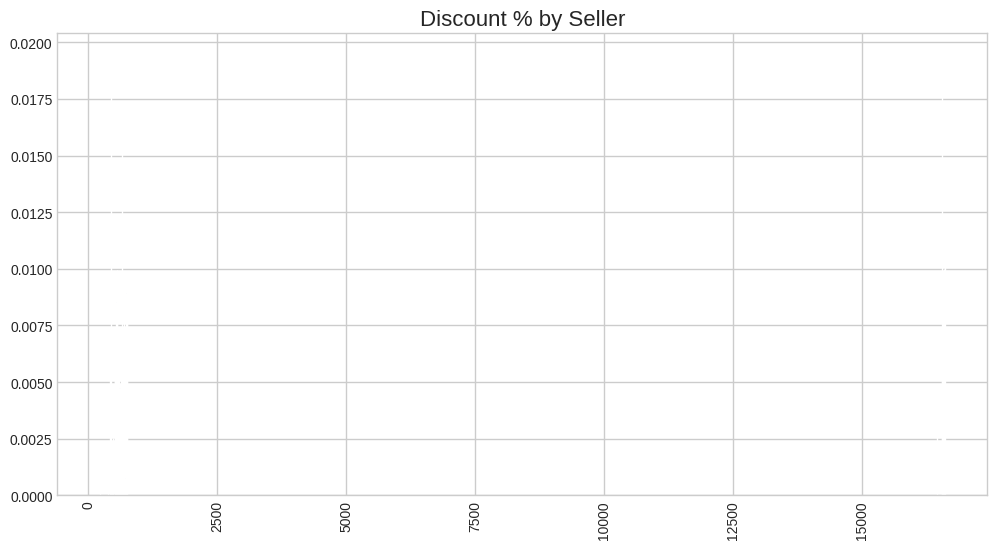

In [34]:

plt.figure(figsize=(12,6))
plt.bar(resumo_vendedor['codigo_vendedor'], resumo_vendedor['percentual_desconto_medio'])
plt.xticks(rotation=90)
plt.title("Discount % by Seller")
plt.show()

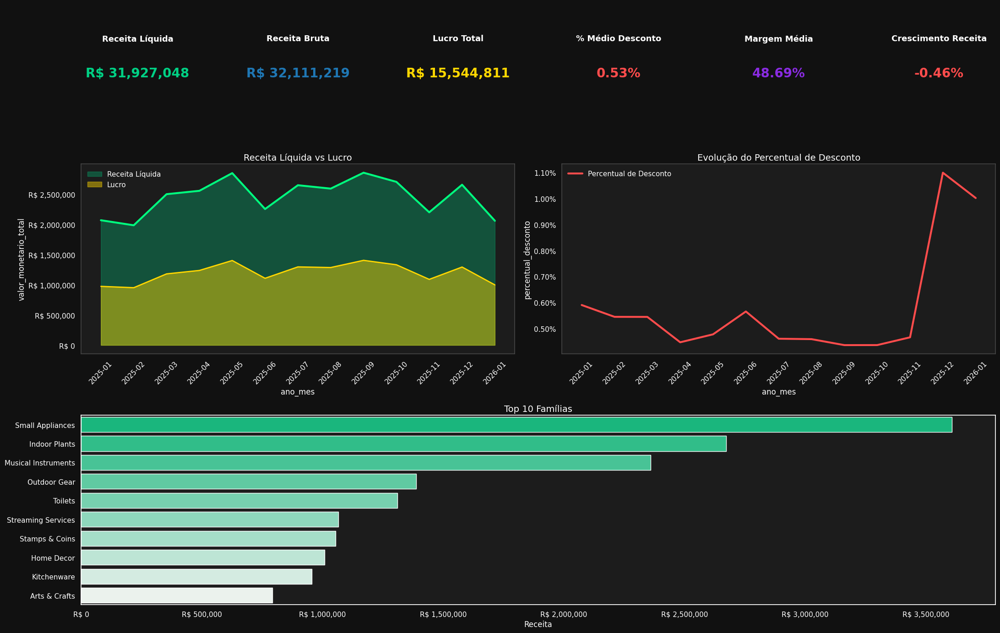

In [114]:

plt.style.use("dark_background")
sns.set_theme(style="dark")

# ===============================
# KPIs
# ===============================

receita_total = base["valor_monetario_total"].sum()
receita_bruta_total = base["faturamento_bruto"].sum()
lucro_total = base["lucro"].sum()
desconto_total = base["valor_desconto"].sum()
percentual_desconto_medio = base["percentual_desconto"].mean()
margem_media = lucro_total / receita_total

crescimento_receita = (
    (mensal["valor_monetario_total"].iloc[-1] -
     mensal["valor_monetario_total"].iloc[0])
    / mensal["valor_monetario_total"].iloc[0]
)

# ===============================
# FIGURA
# ===============================

fig = plt.figure(figsize=(22, 14), facecolor="#111111")
gs = fig.add_gridspec(3, 6, height_ratios=[1.3, 2.5, 2.5])

# ===============================
# KPI CARDS
# ===============================

kpis = [
    ("Receita Líquida", f"R$ {receita_total:,.0f}", "#00D084"),
    ("Receita Bruta", f"R$ {receita_bruta_total:,.0f}", "#1F77B4"),
    ("Lucro Total", f"R$ {lucro_total:,.0f}", "#FFD700"),
    ("% Médio Desconto", f"{percentual_desconto_medio:.2%}", "#FF4C4C"),
    ("Margem Média", f"{margem_media:.2%}", "#8A2BE2"),
    ("Crescimento Receita", f"{crescimento_receita:.2%}",
     "#00FF7F" if crescimento_receita > 0 else "#FF4C4C")
]

for i, (titulo, valor, cor) in enumerate(kpis):
    ax = fig.add_subplot(gs[0, i])
    ax.set_facecolor("#1C1C1C")
    ax.axis("off")
    
    ax.text(0.5, 0.65, titulo,
            ha="center", va="center",
            fontsize=13, fontweight="bold", color="white")
    
    ax.text(0.5, 0.3, valor,
            ha="center", va="center",
            fontsize=20, fontweight="bold", color=cor)

# ===============================
# RECEITA + LUCRO
# ===============================

ax1 = fig.add_subplot(gs[1, :3])
ax1.set_facecolor("#1C1C1C")

ax1.fill_between(
    mensal["ano_mes"],
    mensal["valor_monetario_total"],
    alpha=0.3,
    color="#00D084",
    label="Receita Líquida",
)

sns.lineplot(
    data=mensal,
    x="ano_mes",
    y="valor_monetario_total",
    ax=ax1,
    color="#00FF7F",
    linewidth=3
)

# Área Lucro (cor diferente)
ax1.fill_between(
    mensal["ano_mes"],
    mensal["lucro"],
    color="#FFD700",
    alpha=0.45,
    label="Lucro"
)


sns.lineplot(
    data=mensal,
    x="ano_mes",
    y="lucro",
    ax=ax1,
    color="#FFD700",
    linewidth=2
)

# 🔹 Ajuste de legibilidade
ax1.set_title("Receita Líquida vs Lucro",
              fontsize=14, color="white")
ax1.tick_params(axis='x', rotation=45, colors="white")
ax1.tick_params(axis='y', colors="white")
ax1.xaxis.label.set_color("white")
ax1.yaxis.label.set_color("white")
ax1.legend(frameon=False, facecolor="#1C1C1C", edgecolor="#444444", labelcolor="white")


for spine in ax1.spines.values():
    spine.set_color("#444444")

# ===============================
# DESCONTO %
# ===============================

ax2 = fig.add_subplot(gs[1, 3:])
ax2.set_facecolor("#1C1C1C")

sns.lineplot(
    data=mensal,
    x="ano_mes",
    y="percentual_desconto",
    ax=ax2,
    color="#FF4C4C",
    linewidth=3,
    label ="Percentual de Desconto"
)

ax2.set_title("Evolução do Percentual de Desconto",
              fontsize=14, color="white")

ax2.tick_params(axis='x', rotation=45, colors="white")
ax2.tick_params(axis='y', colors="white")
ax2.xaxis.label.set_color("white")
ax2.yaxis.label.set_color("white")
ax2.legend(frameon=False, facecolor="#1C1C1C", edgecolor="#444444", labelcolor="white")

for spine in ax2.spines.values():
    spine.set_color("#444444")
# ===============================
# FAMÍLIAS
# ===============================

ax3 = fig.add_subplot(gs[2, :])
ax3.set_facecolor("#1C1C1C")

familia_sorted = familia_receita.sort_values(
    "valor_monetario_total", ascending=False
).copy()

familia_sorted["participacao_acumulada"] = (
    familia_sorted["valor_monetario_total"].cumsum()
    / familia_sorted["valor_monetario_total"].sum()
)

sns.barplot(
    data=familia_sorted.head(10),
    x="valor_monetario_total",
    y="descricaofamilia",
    hue="descricaofamilia",
    palette=sns.light_palette("#00D084", n_colors=10, reverse=True),
    legend=False,
    ax=ax3
)


ax3.set_title("Top 10 Famílias",
              fontsize=14, color="white")
ax3.set_xlabel("Receita", color="white")
ax3.set_ylabel("")
ax3.tick_params(axis='x', colors="white")
ax3.tick_params(axis='y', colors="white")

formatter = mtick.StrMethodFormatter('R$ {x:,.0f}')
ax1.yaxis.set_major_formatter(formatter)
ax2.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
ax3.xaxis.set_major_formatter(formatter)
ax1.grid(False)
ax2.grid(False)
ax3.grid(False)

plt.tight_layout()
plt.savefig("/home/labneurofisica/Documents/Códigos/Data/Business Intelligence/Mini Project BI - Equal BI/Raw Data/Dashboards/dashboard_1.png", dpi=600, facecolor=fig.get_facecolor())
plt.show()


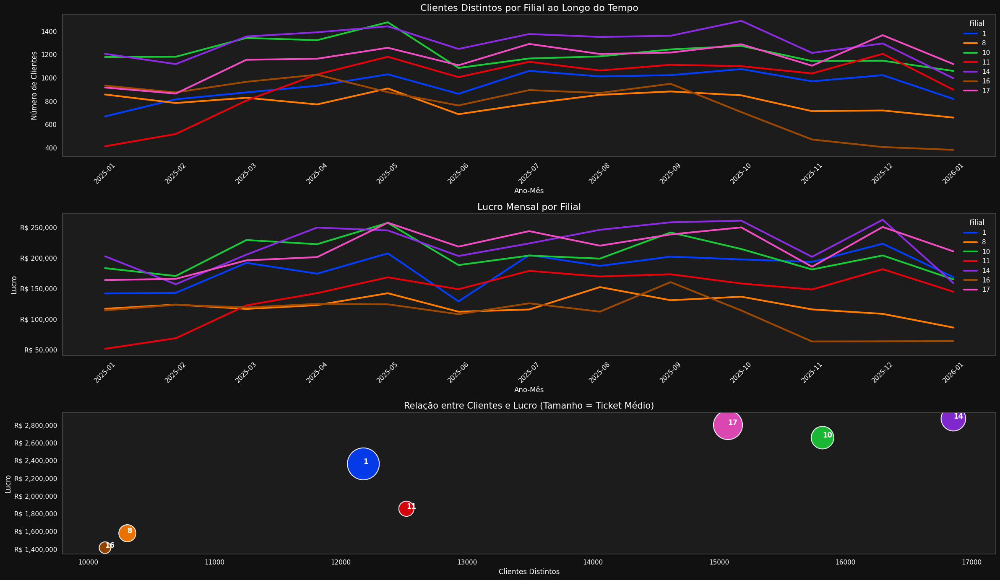

In [115]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as mtick

plt.style.use("dark_background")
sns.set_theme(style="dark")

filiais_unicas = sorted(filial_mensal["filial_venda"].unique())
n_filiais = len(filiais_unicas)
cores_filiais = sns.color_palette("bright", n_filiais)

fig = plt.figure(figsize=(24, 14), facecolor="#111111")
gs = fig.add_gridspec(3, 1, height_ratios=[2.5, 2.5, 2.5])

# =====================================
# 1️⃣ CLIENTES DISTINTOS POR FILIAL
# =====================================

ax1 = fig.add_subplot(gs[0])
ax1.set_facecolor("#1C1C1C")

sns.lineplot(
    data=filial_mensal,
    x="ano_mes",
    y="clientes_distintos",
    hue="filial_venda",
    palette=cores_filiais,
    linewidth=3,
    ax=ax1
)

ax1.set_title("Clientes Distintos por Filial ao Longo do Tempo",
              fontsize=16, color="white")

ax1.tick_params(axis='x', rotation=45, colors="white")
ax1.tick_params(axis='y', colors="white")
ax1.set_xlabel("Ano-Mês", color="white")
ax1.set_ylabel("Número de Clientes", color="white")

leg1 = ax1.legend(title="Filial", frameon=False)
plt.setp(leg1.get_texts(), color='white')
plt.setp(leg1.get_title(), color='white')

for spine in ax1.spines.values():
    spine.set_color("#444444")

# =====================================
# 2️⃣ LUCRO MENSAL POR FILIAL
# =====================================

ax2 = fig.add_subplot(gs[1])
ax2.set_facecolor("#1C1C1C")

sns.lineplot(
    data=filial_mensal,
    x="ano_mes",
    y="lucro",
    hue="filial_venda",
    palette=cores_filiais,
    linewidth=3,
    ax=ax2
)

ax2.set_title("Lucro Mensal por Filial",
              fontsize=16, color="white")

ax2.tick_params(axis='x', rotation=45, colors="white")
ax2.tick_params(axis='y', colors="white")
ax2.yaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
ax2.set_xlabel("Ano-Mês", color="white")
ax2.set_ylabel("Lucro", color="white")

leg2 = ax2.legend(title="Filial", frameon=False)
plt.setp(leg2.get_texts(), color='white')
plt.setp(leg2.get_title(), color='white')

for spine in ax2.spines.values():
    spine.set_color("#444444")

# =====================================
# 3️⃣ CLIENTES vs LUCRO (DRIVER VISUAL)
# =====================================

ax3 = fig.add_subplot(gs[2])
ax3.set_facecolor("#1C1C1C")

resumo = filial_mensal.groupby("filial_venda").agg({
    "clientes_distintos": "sum",
    "lucro": "sum",
    "receita_liquida": "sum"
}).reset_index()

resumo["ticket_medio"] = resumo["receita_liquida"] / resumo["clientes_distintos"]

sns.scatterplot(
    data=resumo,
    x="clientes_distintos",
    y="lucro",
    hue="filial_venda",
    size="ticket_medio",
    sizes=(400, 3000),
    palette=cores_filiais,
    edgecolor="white",
    linewidth=1.5,
    alpha=0.9,
    legend=False,
    ax=ax3
)

for i in range(len(resumo)):
    ax3.text(
        resumo["clientes_distintos"][i],
        resumo["lucro"][i],
        resumo["filial_venda"][i],
        color="white",
        fontsize=12,
        weight="bold"
    )

ax3.set_title("Relação entre Clientes e Lucro (Tamanho = Ticket Médio)",
              fontsize=15, color="white")

ax3.tick_params(axis='x', colors="white")
ax3.tick_params(axis='y', colors="white")
ax3.yaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
ax3.set_xlabel("Clientes Distintos", color="white")
ax3.set_ylabel("Lucro", color="white")

for spine in ax3.spines.values():
    spine.set_color("#444444")

plt.tight_layout()
plt.savefig("/home/labneurofisica/Documents/Códigos/Data/Business Intelligence/Mini Project BI - Equal BI/Raw Data/Dashboards/dashboard_2.png", dpi=600, facecolor=fig.get_facecolor())
plt.show()


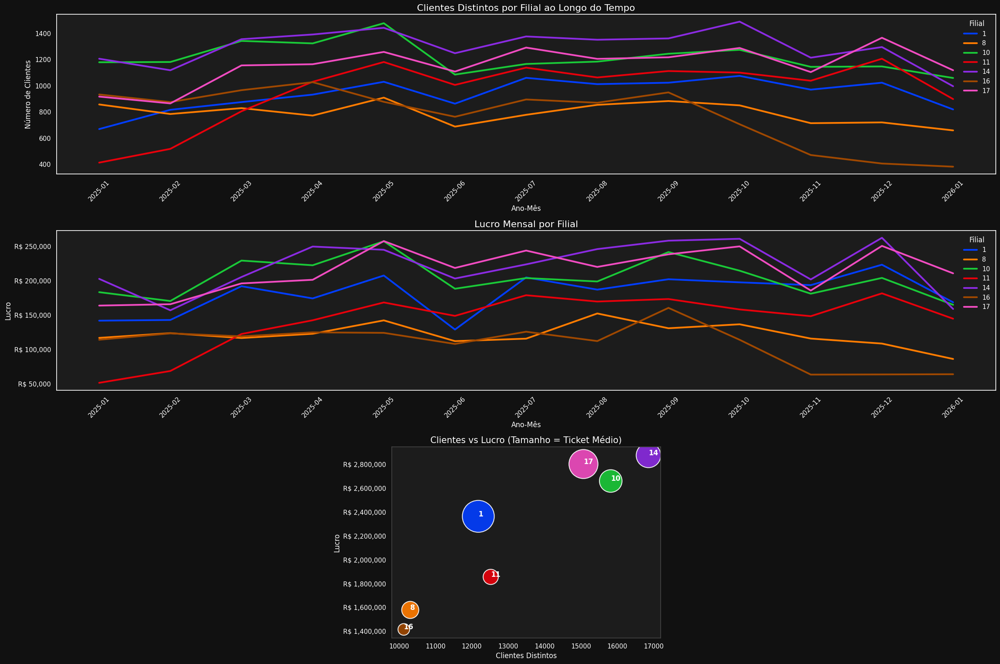

In [41]:
fig = plt.figure(figsize=(24, 16), facecolor="#111111")
gs = fig.add_gridspec(3, 3, height_ratios=[2.5, 2.5, 3])

# =====================================
# 1️⃣ CLIENTES
# =====================================

ax1 = fig.add_subplot(gs[0, :])
ax1.set_facecolor("#1C1C1C")

sns.lineplot(
    data=filial_mensal,
    x="ano_mes",
    y="clientes_distintos",
    hue="filial_venda",
    palette=cores_filiais,
    linewidth=3,
    ax=ax1
)

ax1.set_title("Clientes Distintos por Filial ao Longo do Tempo",
              fontsize=16, color="white")

ax1.tick_params(axis='x', rotation=45, colors="white")
ax1.tick_params(axis='y', colors="white")
ax1.set_xlabel("Ano-Mês", color="white")
ax1.set_ylabel("Número de Clientes", color="white")

leg1 = ax1.legend(title="Filial", frameon=False)
plt.setp(leg1.get_texts(), color='white')
plt.setp(leg1.get_title(), color='white')

# =====================================
# 2️⃣ LUCRO
# =====================================

ax2 = fig.add_subplot(gs[1, :])
ax2.set_facecolor("#1C1C1C")

sns.lineplot(
    data=filial_mensal,
    x="ano_mes",
    y="lucro",
    hue="filial_venda",
    palette=cores_filiais,
    linewidth=3,
    ax=ax2
)

ax2.set_title("Lucro Mensal por Filial",
              fontsize=16, color="white")

ax2.tick_params(axis='x', rotation=45, colors="white")
ax2.tick_params(axis='y', colors="white")
ax2.yaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
ax2.set_xlabel("Ano-Mês", color="white")
ax2.set_ylabel("Lucro", color="white")

leg2 = ax2.legend(title="Filial", frameon=False)
plt.setp(leg2.get_texts(), color='white')
plt.setp(leg2.get_title(), color='white')

# =====================================
# 3️⃣ SCATTER CENTRAL MAIS QUADRADO
# =====================================

ax3 = fig.add_subplot(gs[2, 1])  # coluna central
ax3.set_facecolor("#1C1C1C")

resumo = filial_mensal.groupby("filial_venda").agg({
    "clientes_distintos": "sum",
    "lucro": "sum",
    "receita_liquida": "sum"
}).reset_index()

resumo["ticket_medio"] = resumo["receita_liquida"] / resumo["clientes_distintos"]

sns.scatterplot(
    data=resumo,
    x="clientes_distintos",
    y="lucro",
    hue="filial_venda",
    size="ticket_medio",
    sizes=(400, 3000),
    palette=cores_filiais,
    edgecolor="white",
    linewidth=1.5,
    alpha=0.9,
    legend=False,
    ax=ax3
)

for i in range(len(resumo)):
    ax3.text(
        resumo["clientes_distintos"][i],
        resumo["lucro"][i],
        resumo["filial_venda"][i],
        color="white",
        fontsize=12,
        weight="bold"
    )

ax3.set_title("Clientes vs Lucro (Tamanho = Ticket Médio)",
              fontsize=15, color="white")

ax3.tick_params(axis='x', colors="white")
ax3.tick_params(axis='y', colors="white")
ax3.yaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
ax3.set_xlabel("Clientes Distintos", color="white")
ax3.set_ylabel("Lucro", color="white")

for spine in ax3.spines.values():
    spine.set_color("#444444")



plt.tight_layout()
plt.show()

Os vendedores 37, 3, 21 e 49 apresentam os maiores percentuais médios de desconto. Entretanto, esses vendedores não lideram o ranking de lucro acumulado, o que indica que a concessão de desconto, isoladamente, não determina o desempenho financeiro.

Observa-se ainda que os vendedores com maior faturamento bruto também são os com maior faturamento líquido, sugerindo que os descontos aplicados não alteram significativamente a hierarquia de receita entre vendedores.

A diferença máxima aproximada de 20% entre as margens indica que há certa autonomia na negociação, mas dentro de limites impostos por políticas comerciais da empresa.

Adicionalmente, verifica-se que vendedores com maior desconto percentual não necessariamente apresentam menor margem. O vendedor 37, por exemplo, possui desconto médio superior ao vendedor 1, mas apresenta margem mais elevada. Isso sugere que a composição do mix de produtos vendidos exerce influência determinante sobre a margem final.

Conclui-se, portanto, que o desempenho de lucro dos vendedores é resultado de uma combinação entre volume de vendas, ticket médio, política de desconto e, principalmente, o mix de produtos comercializados.

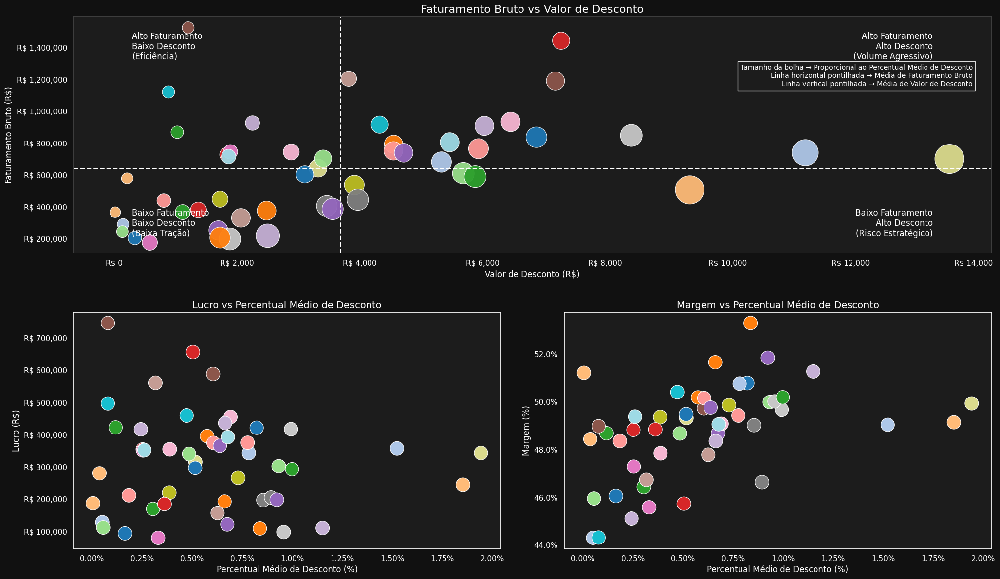

In [49]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as mtick
import numpy as np

plt.style.use("dark_background")
sns.set_theme(style="dark")

fig = plt.figure(figsize=(24, 14), facecolor="#111111")
gs = fig.add_gridspec(2, 2, height_ratios=[3, 3])

vendedores_destaque = [37, 3, 21, 49]

# ==========================================
# 🎨 MAPA DE CORES FIXO POR VENDEDOR
# ==========================================

vendedores_unicos = sorted(resumo_vendedor["codigo_vendedor"].unique())
palette_base = sns.color_palette("tab20", len(vendedores_unicos))
mapa_cores = dict(zip(vendedores_unicos, palette_base))

# ==========================================
# NORMALIZAÇÃO DO TAMANHO DAS BOLHAS
# ==========================================

min_size = 250
max_size = 1800

desconto_min = resumo_vendedor["percentual_desconto_medio"].min()
desconto_max = resumo_vendedor["percentual_desconto_medio"].max()

resumo_vendedor["bubble_size"] = (
    (resumo_vendedor["percentual_desconto_medio"] - desconto_min)
    / (desconto_max - desconto_min)
) * (max_size - min_size) + min_size


# ==========================================
# 1️⃣ FATURAMENTO vs VALOR_DESCONTO
# ==========================================

ax1 = fig.add_subplot(gs[0, :])
ax1.set_facecolor("#1C1C1C")

media_faturamento = resumo_vendedor["faturamento_bruto"].mean()
media_desconto = resumo_vendedor["valor_desconto"].mean()

xmin, xmax = resumo_vendedor["valor_desconto"].min(), resumo_vendedor["valor_desconto"].max()
ymin, ymax = resumo_vendedor["faturamento_bruto"].min(), resumo_vendedor["faturamento_bruto"].max()

sns.scatterplot(
    data=resumo_vendedor,
    x="valor_desconto",
    y="faturamento_bruto",
    hue="codigo_vendedor",
    palette=mapa_cores,
    size="bubble_size",
    sizes=(min_size, max_size),
    edgecolor="white",
    linewidth=0.8,
    alpha=0.95,
    legend=False,
    ax=ax1
)

# Linhas médias
ax1.axhline(media_faturamento, color="white", linestyle="--", linewidth=1.8)
ax1.axvline(media_desconto, color="white", linestyle="--", linewidth=1.8)

# Textos nos cantos
padding_x = (xmax - xmin) * 0.02
padding_y = (ymax - ymin) * 0.02

ax1.text(xmin + padding_x, ymax - padding_y,
         "Alto Faturamento\nBaixo Desconto\n(Eficiência)",
         color="white", fontsize=12, ha="left", va="top")

ax1.text(xmax - padding_x, ymax - padding_y,
         "Alto Faturamento\nAlto Desconto\n(Volume Agressivo)",
         color="white", fontsize=12, ha="right", va="top")

ax1.text(xmin + padding_x, ymin + padding_y,
         "Baixo Faturamento\nBaixo Desconto\n(Baixa Tração)",
         color="white", fontsize=12, ha="left", va="bottom")

ax1.text(xmax - padding_x, ymin + padding_y,
         "Baixo Faturamento\nAlto Desconto\n(Risco Estratégico)",
         color="white", fontsize=12, ha="right", va="bottom")

# Destaque vendedores estratégicos
for _, row in resumo_vendedor.iterrows():
    if row["codigo_vendedor"] in vendedores_destaque:
        ax1.scatter(
            row["valor_desconto"],
            row["faturamento_bruto"],
            s=2500,
            facecolors="none",
            edgecolors="cyan",
            linewidth=2.5
        )
        ax1.text(
            row["valor_desconto"],
            row["faturamento_bruto"],
            str(row["codigo_vendedor"]),
            color="cyan",
            fontsize=12,
            weight="bold"
        )

# Legenda explicativa
legenda_info = (
    "Tamanho da bolha → Proporcional ao Percentual Médio de Desconto\n"
    "Linha horizontal pontilhada → Média de Faturamento Bruto\n"
    "Linha vertical pontilhada → Média de Valor de Desconto"
)

ax1.text(
    0.98, 0.70,
    legenda_info,
    transform=ax1.transAxes,
    fontsize=10,
    color="white",
    ha="right",
    va="bottom",
    bbox=dict(facecolor="#1C1C1C", alpha=0.85, edgecolor="white")
)

ax1.set_title("Faturamento Bruto vs Valor de Desconto",
              fontsize=16, color="white")

ax1.xaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
ax1.yaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
ax1.set_ylabel("Faturamento Bruto (R$)", fontsize=12, color="white")
ax1.set_xlabel("Valor de Desconto (R$)", fontsize=12, color="white")
ax1.tick_params(colors="white")

for spine in ax1.spines.values():
    spine.set_color("#444444")


# ==========================================
# 2️⃣ LUCRO vs % DESCONTO MÉDIO
# ==========================================

ax2 = fig.add_subplot(gs[1, 0])
ax2.set_facecolor("#1C1C1C")

sns.scatterplot(
    data=resumo_vendedor,
    x="percentual_desconto_medio",
    y="lucro",
    hue="codigo_vendedor",
    palette=mapa_cores,
    s=400,
    edgecolor="white",
    linewidth=0.8,
    legend=False,
    ax=ax2
)

## Linha de tendência
#sns.regplot(
#    data=resumo_vendedor,
#    x="percentual_desconto_medio",
#    y="lucro",
#    scatter=False,
#    ax=ax2,
#    color="white",
#    line_kws={"linewidth":1.5, "alpha":0.7}
#)
#
## Correlação
#corr_lucro = resumo_vendedor["percentual_desconto_medio"].corr(resumo_vendedor["lucro"])
#ax2.text(
#    0.02, 0.95,
#    f"Correlação: {corr_lucro:.2f}",
#    transform=ax2.transAxes,
#    color="white",
#    fontsize=11,
#    va="top"
#)

ax2.set_title("Lucro vs Percentual Médio de Desconto",
              fontsize=14, color="white")

ax2.yaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
ax2.xaxis.set_major_formatter(mtick.PercentFormatter(1.0))
ax2.set_ylabel("Lucro (R$)", fontsize=12, color="white")
ax2.set_xlabel("Percentual Médio de Desconto (%)", fontsize=12, color="white")
ax2.tick_params(colors="white")


# ==========================================
# 3️⃣ MARGEM vs % DESCONTO MÉDIO
# ==========================================

ax3 = fig.add_subplot(gs[1, 1])
ax3.set_facecolor("#1C1C1C")

sns.scatterplot(
    data=resumo_vendedor,
    x="percentual_desconto_medio",
    y="margem",
    hue="codigo_vendedor",
    palette=mapa_cores,
    s=400,
    edgecolor="white",
    linewidth=0.8,
    legend=False,
    ax=ax3
)

## Linha de tendência
#sns.regplot(
#    data=resumo_vendedor,
#    x="percentual_desconto_medio",
#    y="margem",
#    scatter=False,
#    ax=ax3,
#    color="white",
#    line_kws={"linewidth":1.5, "alpha":0.7}
#)
#
## Correlação
#corr_margem = resumo_vendedor["percentual_desconto_medio"].corr(resumo_vendedor["margem"])
#ax3.text(
#    0.02, 0.95,
#    f"Correlação: {corr_margem:.2f}",
#    transform=ax3.transAxes,
#    color="white",
#    fontsize=11,
#    va="top"
#)

ax3.set_title("Margem vs Percentual Médio de Desconto",
              fontsize=14, color="white")

ax3.xaxis.set_major_formatter(mtick.PercentFormatter(1.0))
ax3.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
ax3.set_ylabel("Margem (%)", fontsize=12, color="white")
ax3.set_xlabel("Percentual Médio de Desconto (%)", fontsize=12, color="white")
ax3.tick_params(colors="white")


plt.subplots_adjust(hspace=0.25, wspace=0.15)
plt.show()


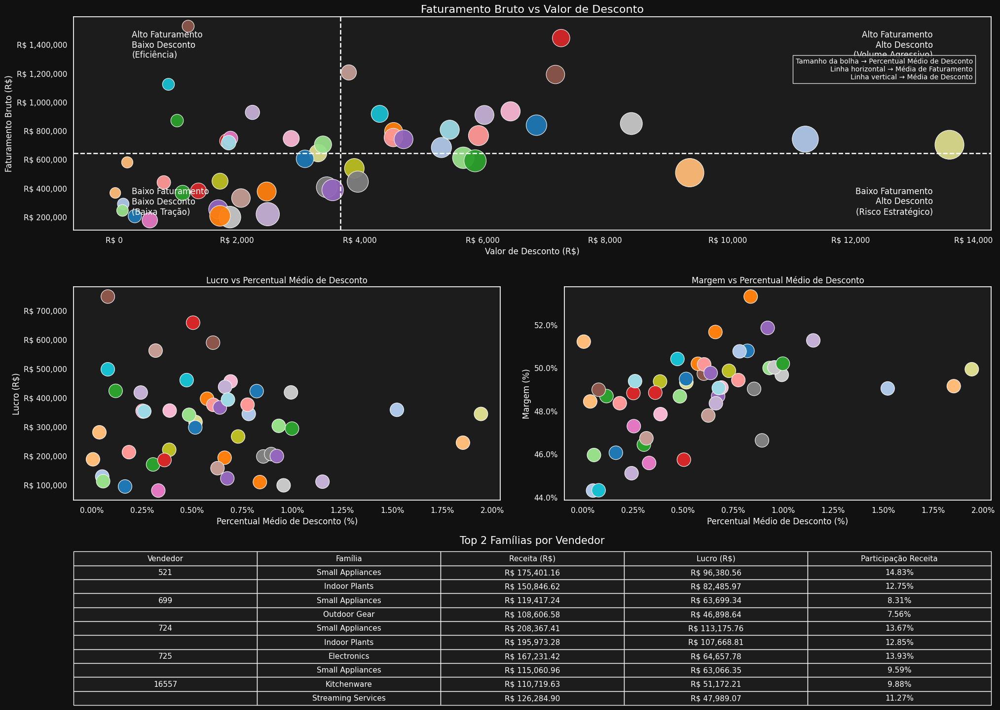

In [116]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as mtick
import numpy as np
import pandas as pd

plt.style.use("dark_background")
sns.set_theme(style="dark")

fig = plt.figure(figsize=(24, 18), facecolor="#111111")
gs = fig.add_gridspec(3, 2, height_ratios=[3, 3, 2])

vendedores_destaque = [37, 3, 21, 49]

# ==========================================
# 🎨 MAPA DE CORES FIXO
# ==========================================

vendedores_unicos = sorted(resumo_vendedor["codigo_vendedor"].unique())
palette_base = sns.color_palette("tab20", len(vendedores_unicos))
mapa_cores = dict(zip(vendedores_unicos, palette_base))

# ==========================================
# NORMALIZAÇÃO DO TAMANHO DAS BOLHAS
# ==========================================

min_size = 250
max_size = 1800

desconto_min = resumo_vendedor["percentual_desconto_medio"].min()
desconto_max = resumo_vendedor["percentual_desconto_medio"].max()

resumo_vendedor["bubble_size"] = (
    (resumo_vendedor["percentual_desconto_medio"] - desconto_min)
    / (desconto_max - desconto_min)
) * (max_size - min_size) + min_size

# ==========================================
# 1️⃣ FATURAMENTO vs DESCONTO
# ==========================================

ax1 = fig.add_subplot(gs[0, :])
ax1.set_facecolor("#1C1C1C")

media_faturamento = resumo_vendedor["faturamento_bruto"].mean()
media_desconto = resumo_vendedor["valor_desconto"].mean()

xmin, xmax = resumo_vendedor["valor_desconto"].min(), resumo_vendedor["valor_desconto"].max()
ymin, ymax = resumo_vendedor["faturamento_bruto"].min(), resumo_vendedor["faturamento_bruto"].max()

sns.scatterplot(
    data=resumo_vendedor,
    x="valor_desconto",
    y="faturamento_bruto",
    hue="codigo_vendedor",
    palette=mapa_cores,
    size="bubble_size",
    sizes=(min_size, max_size),
    edgecolor="white",
    linewidth=0.8,
    alpha=0.95,
    legend=False,
    ax=ax1
)

ax1.axhline(media_faturamento, color="white", linestyle="--", linewidth=1.8)
ax1.axvline(media_desconto, color="white", linestyle="--", linewidth=1.8)

padding_x = (xmax - xmin) * 0.02
padding_y = (ymax - ymin) * 0.02

ax1.text(xmin + padding_x, ymax - padding_y,
         "Alto Faturamento\nBaixo Desconto\n(Eficiência)",
         color="white", fontsize=12, ha="left", va="top")

ax1.text(xmax - padding_x, ymax - padding_y,
         "Alto Faturamento\nAlto Desconto\n(Volume Agressivo)",
         color="white", fontsize=12, ha="right", va="top")

ax1.text(xmin + padding_x, ymin + padding_y,
         "Baixo Faturamento\nBaixo Desconto\n(Baixa Tração)",
         color="white", fontsize=12, ha="left", va="bottom")

ax1.text(xmax - padding_x, ymin + padding_y,
         "Baixo Faturamento\nAlto Desconto\n(Risco Estratégico)",
         color="white", fontsize=12, ha="right", va="bottom")

# Legenda explicativa
legenda_info = (
    "Tamanho da bolha → Percentual Médio de Desconto\n"
    "Linha horizontal → Média de Faturamento\n"
    "Linha vertical → Média de Desconto"
)

ax1.text(
    0.98, 0.70,
    legenda_info,
    transform=ax1.transAxes,
    fontsize=10,
    color="white",
    ha="right",
    va="bottom",
    bbox=dict(facecolor="#1C1C1C", alpha=0.85, edgecolor="white")
)

ax1.set_title("Faturamento Bruto vs Valor de Desconto",
              fontsize=16, color="white")

ax1.xaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
ax1.yaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
ax1.set_ylabel("Faturamento Bruto (R$)", fontsize=12, color="white")
ax1.set_xlabel("Valor de Desconto (R$)", fontsize=12, color="white")
ax1.tick_params(colors="white")

# ==========================================
# 2️⃣ LUCRO vs % DESCONTO
# ==========================================

ax2 = fig.add_subplot(gs[1, 0])
ax2.set_facecolor("#1C1C1C")

sns.scatterplot(
    data=resumo_vendedor,
    x="percentual_desconto_medio",
    y="lucro",
    hue="codigo_vendedor",
    palette=mapa_cores,
    s=400,
    edgecolor="white",
    linewidth=0.8,
    legend=False,
    ax=ax2
)

ax2.yaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
ax2.xaxis.set_major_formatter(mtick.PercentFormatter(1.0))
ax2.tick_params(colors="white")
ax2.set_ylabel("Lucro (R$)", fontsize=12, color="white")
ax2.set_xlabel("Percentual Médio de Desconto (%)", fontsize=12, color="white")
ax2.set_title("Lucro vs Percentual Médio de Desconto", color="white")

# ==========================================
# 3️⃣ MARGEM vs % DESCONTO
# ==========================================

ax3 = fig.add_subplot(gs[1, 1])
ax3.set_facecolor("#1C1C1C")

sns.scatterplot(
    data=resumo_vendedor,
    x="percentual_desconto_medio",
    y="margem",
    hue="codigo_vendedor",
    palette=mapa_cores,
    s=400,
    edgecolor="white",
    linewidth=0.8,
    legend=False,
    ax=ax3
)


ax3.xaxis.set_major_formatter(mtick.PercentFormatter(1.0))
ax3.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
ax3.tick_params(colors="white")
ax3.set_ylabel("Margem (%)", fontsize=12, color="white")
ax3.set_xlabel("Percentual Médio de Desconto (%)", fontsize=12, color="white")
ax3.set_title("Margem vs Percentual Médio de Desconto", color="white")

# ==========================================
# 4️⃣ TABELA TOP 2 FAMÍLIAS (SEM REPETIÇÃO)
# ==========================================

ax4 = fig.add_subplot(gs[2, :])
ax4.axis('off')
ax4.set_facecolor("#1C1C1C")

top2_formatado = top2_familias.copy()

# Ordenar por vendedor
top2_formatado = top2_formatado.sort_values(
    ["codigo_vendedor", "lucro"],
    ascending=[True, False]
).reset_index(drop=True)

# Remover repetição visual do vendedor
top2_formatado["codigo_vendedor"] = top2_formatado["codigo_vendedor"].astype(str)

for i in range(1, len(top2_formatado)):
    if top2_formatado.loc[i, "codigo_vendedor"] == top2_formatado.loc[i-1, "codigo_vendedor"]:
        top2_formatado.loc[i, "codigo_vendedor"] = ""

# Formatação monetária e percentual
top2_formatado["valor_monetario_total"] = top2_formatado["valor_monetario_total"].map(lambda x: f"R$ {x:,.2f}")
top2_formatado["lucro"] = top2_formatado["lucro"].map(lambda x: f"R$ {x:,.2f}")
top2_formatado["participacao_receita"] = top2_formatado["participacao_receita"].map(lambda x: f"{x:.2%}")

# Renomear colunas
top2_formatado.columns = [
    "Vendedor",
    "Família",
    "Receita (R$)",
    "Lucro (R$)",
    "Participação Receita"
]

tabela = ax4.table(
    cellText=top2_formatado.values,
    colLabels=top2_formatado.columns,
    cellLoc='center',
    loc='center'
)

tabela.auto_set_font_size(False)
tabela.set_fontsize(11)
tabela.scale(1, 1.8)

# Estilo dark
for (row, col), cell in tabela.get_celld().items():
    cell.set_edgecolor("white")
    cell.set_facecolor("#1C1C1C")
    cell.get_text().set_color("white")

ax4.set_title("Top 2 Famílias por Vendedor",
              fontsize=15, color="white", pad=20)


plt.subplots_adjust(hspace=0.30, wspace=0.15)
plt.savefig("/home/labneurofisica/Documents/Códigos/Data/Business Intelligence/Mini Project BI - Equal BI/Raw Data/Dashboards/dashboard_3.png", dpi=600, bbox_inches='tight')
plt.show()


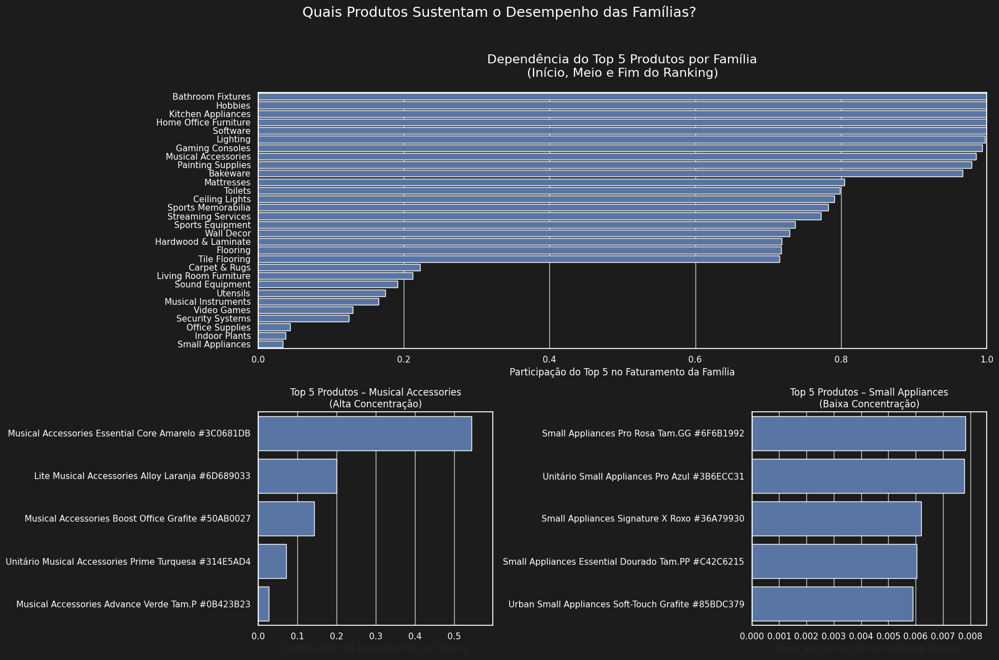

In [117]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

sns.set_style("whitegrid")

# ================================
# PREPARAÇÃO DOS DADOS
# ================================

# Ordenar dependência
top5_dependencia_sorted = top5_dependencia.sort_values(
    "participacao_top5", ascending=False
).reset_index(drop=True)

# Selecionar começo, meio e fim
n = len(top5_dependencia_sorted)

inicio = top5_dependencia_sorted.head(10)
meio = top5_dependencia_sorted.iloc[n//2 - 5 : n//2 + 5]
fim = top5_dependencia_sorted.tail(10)

dependencia_plot = pd.concat([inicio, meio, fim])

# Produtos exemplo
musical = top5_produtos_familia[
    top5_produtos_familia["descricaofamilia"] == "Musical Accessories"
].sort_values("participacao_familia", ascending=False)

small_appliances = top5_produtos_familia[
    top5_produtos_familia["descricaofamilia"] == "Small Appliances"
].sort_values("participacao_familia", ascending=False)

# ================================
# CRIAÇÃO DO DASHBOARD
# ================================

fig = plt.figure(figsize=(18, 12))
gs = fig.add_gridspec(2, 2, height_ratios=[1.2, 1])

fig.patch.set_facecolor("#1C1C1C")

# ======================================
# 1️⃣ GRÁFICO PRINCIPAL – DEPENDÊNCIA
# ======================================

ax1 = fig.add_subplot(gs[0, :])
ax1.set_facecolor("#1C1C1C")

sns.barplot(
    data=dependencia_plot,
    x="participacao_top5",
    y="descricaofamilia",
    ax=ax1
)

ax1.set_title(
    "Dependência do Top 5 Produtos por Família\n(Início, Meio e Fim do Ranking)",
    color="white",
    fontsize=16,
    pad=20
)

ax1.set_xlabel("Participação do Top 5 no Faturamento da Família",
               color="white")
ax1.set_ylabel("")
ax1.tick_params(colors="white")
ax1.set_xlim(0, 1)

for spine in ax1.spines.values():
    spine.set_color("white")

# ======================================
# 2️⃣ TOP 5 – MUSICAL ACCESSORIES
# ======================================

ax2 = fig.add_subplot(gs[1, 0])
ax2.set_facecolor("#1C1C1C")

sns.barplot(
    data=musical,
    x="participacao_familia",
    y="descricaoproduto",
    ax=ax2
)

ax2.set_title(
    "Top 5 Produtos – Musical Accessories\n(Alta Concentração)",
    color="white"
)

ax2.set_xlabel("Participação no Faturamento da Família")
ax2.set_ylabel("")
ax2.tick_params(colors="white")
ax2.set_xlim(0, musical["participacao_familia"].max() * 1.1)

for spine in ax2.spines.values():
    spine.set_color("white")

# ======================================
# 3️⃣ TOP 5 – SMALL APPLIANCES
# ======================================

ax3 = fig.add_subplot(gs[1, 1])
ax3.set_facecolor("#1C1C1C")

sns.barplot(
    data=small_appliances,
    x="participacao_familia",
    y="descricaoproduto",
    ax=ax3
)

ax3.set_title(
    "Top 5 Produtos – Small Appliances\n(Baixa Concentração)",
    color="white"
)

ax3.set_xlabel("Participação no Faturamento da Família")
ax3.set_ylabel("")
ax3.tick_params(colors="white")
ax3.set_xlim(0, small_appliances["participacao_familia"].max() * 1.1)

for spine in ax3.spines.values():
    spine.set_color("white")

# ================================
# TÍTULO GERAL
# ================================

plt.suptitle(
    "Quais Produtos Sustentam o Desempenho das Famílias?",
    color="white",
    fontsize=18
)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig("/home/labneurofisica/Documents/Códigos/Data/Business Intelligence/Mini Project BI - Equal BI/Raw Data/Dashboards/dashboard_5.png", dpi=600)
plt.show()


/tmp/ipykernel_7731/3674109711.py:204: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=familia_sorted.head(10), x="valor_monetario_total", y="descricaofamilia",


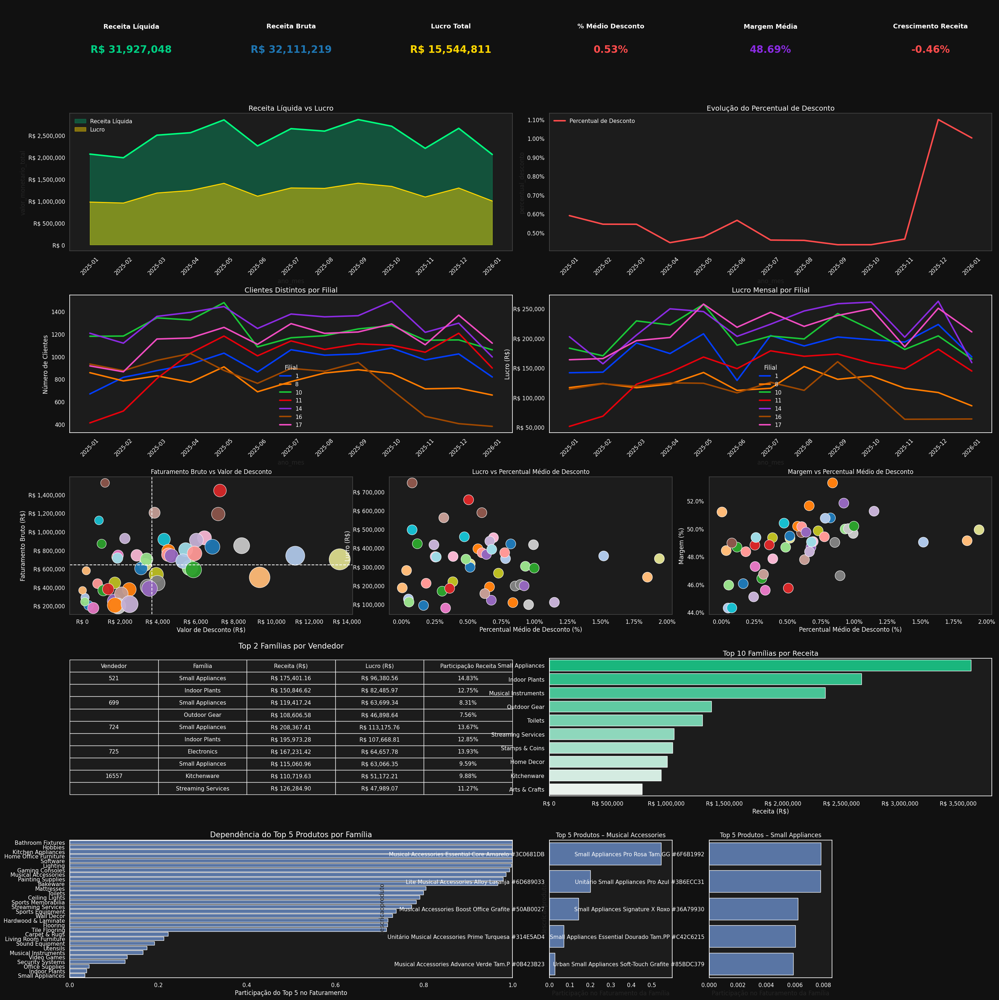

In [55]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as mtick
import pandas as pd
import numpy as np

# ===============================
# ESTILO GERAL
# ===============================
plt.style.use("dark_background")
sns.set_theme(style="dark")

# ===============================
# FIGURA PRINCIPAL
# ===============================
fig = plt.figure(figsize=(28, 28), facecolor="#111111")
gs = fig.add_gridspec(6, 6, height_ratios=[1.2, 2.5, 2.5, 2.5, 2.5, 2.5])

# ===============================
# KPI CARDS
# ===============================
kpis = [
    ("Receita Líquida", f"R$ {base['valor_monetario_total'].sum():,.0f}", "#00D084"),
    ("Receita Bruta", f"R$ {base['faturamento_bruto'].sum():,.0f}", "#1F77B4"),
    ("Lucro Total", f"R$ {base['lucro'].sum():,.0f}", "#FFD700"),
    ("% Médio Desconto", f"{base['percentual_desconto'].mean():.2%}", "#FF4C4C"),
    ("Margem Média", f"{base['lucro'].sum()/base['valor_monetario_total'].sum():.2%}", "#8A2BE2"),
    ("Crescimento Receita", 
     f"{(mensal['valor_monetario_total'].iloc[-1]-mensal['valor_monetario_total'].iloc[0])/mensal['valor_monetario_total'].iloc[0]:.2%}", 
     "#00FF7F" if (mensal['valor_monetario_total'].iloc[-1]-mensal['valor_monetario_total'].iloc[0]) > 0 else "#FF4C4C")
]

for i, (titulo, valor, cor) in enumerate(kpis):
    ax = fig.add_subplot(gs[0, i])
    ax.set_facecolor("#1C1C1C")
    ax.axis("off")
    ax.text(0.5, 0.65, titulo, ha="center", va="center",
            fontsize=13, fontweight="bold", color="white")
    ax.text(0.5, 0.3, valor, ha="center", va="center",
            fontsize=20, fontweight="bold", color=cor)

# ===============================
# RECEITA LÍQUIDA vs LUCRO
# ===============================
ax1 = fig.add_subplot(gs[1, :3])
ax1.set_facecolor("#1C1C1C")

ax1.fill_between(
    mensal["ano_mes"],
    mensal["valor_monetario_total"],
    alpha=0.3,
    color="#00D084",
    label="Receita Líquida"
)
sns.lineplot(data=mensal, x="ano_mes", y="valor_monetario_total",
             ax=ax1, color="#00FF7F", linewidth=3)
ax1.fill_between(mensal["ano_mes"], mensal["lucro"], alpha=0.45,
                 color="#FFD700", label="Lucro")
sns.lineplot(data=mensal, x="ano_mes", y="lucro",
             ax=ax1, color="#FFD700", linewidth=2)

ax1.set_title("Receita Líquida vs Lucro", fontsize=14, color="white")
ax1.tick_params(axis='x', rotation=45, colors="white")
ax1.tick_params(axis='y', colors="white")
ax1.legend(frameon=False, facecolor="#1C1C1C", edgecolor="#444444", labelcolor="white")
for spine in ax1.spines.values():
    spine.set_color("#444444")
ax1.yaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))

# ===============================
# PERCENTUAL DE DESCONTO
# ===============================
ax2 = fig.add_subplot(gs[1, 3:])
ax2.set_facecolor("#1C1C1C")
sns.lineplot(data=mensal, x="ano_mes", y="percentual_desconto",
             ax=ax2, color="#FF4C4C", linewidth=3, label="Percentual de Desconto")
ax2.set_title("Evolução do Percentual de Desconto", fontsize=14, color="white")
ax2.tick_params(axis='x', rotation=45, colors="white")
ax2.tick_params(axis='y', colors="white")
ax2.legend(frameon=False, facecolor="#1C1C1C", edgecolor="#444444", labelcolor="white")
ax2.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
for spine in ax2.spines.values():
    spine.set_color("#444444")

# ===============================
# CLIENTES DISTINTOS POR FILIAL
# ===============================
ax3 = fig.add_subplot(gs[2, :3])
ax3.set_facecolor("#1C1C1C")
sns.lineplot(data=filial_mensal, x="ano_mes", y="clientes_distintos",
             hue="filial_venda", palette=cores_filiais, linewidth=3, ax=ax3)
ax3.set_title("Clientes Distintos por Filial", fontsize=14, color="white")
ax3.tick_params(axis='x', rotation=45, colors="white")
ax3.tick_params(axis='y', colors="white")
ax3.set_ylabel("Número de Clientes", color="white")
leg1 = ax3.legend(title="Filial", frameon=False)
plt.setp(leg1.get_texts(), color='white')
plt.setp(leg1.get_title(), color='white')

# ===============================
# LUCRO MENSAL POR FILIAL
# ===============================
ax4 = fig.add_subplot(gs[2, 3:])
ax4.set_facecolor("#1C1C1C")
sns.lineplot(data=filial_mensal, x="ano_mes", y="lucro",
             hue="filial_venda", palette=cores_filiais, linewidth=3, ax=ax4)
ax4.set_title("Lucro Mensal por Filial", fontsize=14, color="white")
ax4.tick_params(axis='x', rotation=45, colors="white")
ax4.tick_params(axis='y', colors="white")
ax4.yaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
ax4.set_ylabel("Lucro (R$)", color="white")
leg2 = ax4.legend(title="Filial", frameon=False)
plt.setp(leg2.get_texts(), color='white')
plt.setp(leg2.get_title(), color='white')

# ===============================
# VENDEDORES – FATURAMENTO vs DESCONTO
# ===============================
ax5 = fig.add_subplot(gs[3, :2])
ax5.set_facecolor("#1C1C1C")
sns.scatterplot(data=resumo_vendedor, x="valor_desconto", y="faturamento_bruto",
                hue="codigo_vendedor", palette=mapa_cores,
                size="bubble_size", sizes=(250, 1800),
                edgecolor="white", linewidth=0.8, alpha=0.95, legend=False, ax=ax5)

# Linhas médias
ax5.axhline(resumo_vendedor["faturamento_bruto"].mean(), color="white", linestyle="--", linewidth=1.5)
ax5.axvline(resumo_vendedor["valor_desconto"].mean(), color="white", linestyle="--", linewidth=1.5)
ax5.set_title("Faturamento Bruto vs Valor de Desconto", color="white")
ax5.xaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
ax5.yaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
ax5.set_ylabel("Faturamento Bruto (R$)", color="white")
ax5.set_xlabel("Valor de Desconto (R$)", color="white")
ax5.tick_params(colors="white")
for spine in ax5.spines.values():
    spine.set_color("#444444")

# ===============================
# LUCRO vs % DESCONTO
# ===============================
ax6 = fig.add_subplot(gs[3, 2:4])
ax6.set_facecolor("#1C1C1C")
sns.scatterplot(data=resumo_vendedor, x="percentual_desconto_medio", y="lucro",
                hue="codigo_vendedor", palette=mapa_cores,
                s=400, edgecolor="white", linewidth=0.8, legend=False, ax=ax6)
ax6.set_title("Lucro vs Percentual Médio de Desconto", color="white")
ax6.xaxis.set_major_formatter(mtick.PercentFormatter(1.0))
ax6.yaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
ax6.set_ylabel("Lucro (R$)", color="white")
ax6.set_xlabel("Percentual Médio de Desconto (%)", color="white")
ax6.tick_params(colors="white")
for spine in ax6.spines.values():
    spine.set_color("#444444")

# ===============================
# MARGEM vs % DESCONTO
# ===============================
ax7 = fig.add_subplot(gs[3, 4:])
ax7.set_facecolor("#1C1C1C")
sns.scatterplot(data=resumo_vendedor, x="percentual_desconto_medio", y="margem",
                hue="codigo_vendedor", palette=mapa_cores,
                s=400, edgecolor="white", linewidth=0.8, legend=False, ax=ax7)
ax7.set_title("Margem vs Percentual Médio de Desconto", color="white")
ax7.xaxis.set_major_formatter(mtick.PercentFormatter(1.0))
ax7.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
ax7.set_ylabel("Margem (%)", color="white")
ax7.set_xlabel("Percentual Médio de Desconto (%)", color="white")
ax7.tick_params(colors="white")
for spine in ax7.spines.values():
    spine.set_color("#444444")

# ===============================
# TABELA TOP 2 FAMÍLIAS POR VENDEDOR
# ===============================
ax8 = fig.add_subplot(gs[4, :3])
ax8.axis('off')
ax8.set_facecolor("#1C1C1C")
top2_formatado = top2_familias.copy().sort_values(["codigo_vendedor","lucro"], ascending=[True,False]).reset_index(drop=True)
top2_formatado["codigo_vendedor"] = top2_formatado["codigo_vendedor"].astype(str)
for i in range(1,len(top2_formatado)):
    if top2_formatado.loc[i,"codigo_vendedor"] == top2_formatado.loc[i-1,"codigo_vendedor"]:
        top2_formatado.loc[i,"codigo_vendedor"] = ""
top2_formatado["valor_monetario_total"] = top2_formatado["valor_monetario_total"].map(lambda x: f"R$ {x:,.2f}")
top2_formatado["lucro"] = top2_formatado["lucro"].map(lambda x: f"R$ {x:,.2f}")
top2_formatado["participacao_receita"] = top2_formatado["participacao_receita"].map(lambda x: f"{x:.2%}")
top2_formatado.columns = ["Vendedor","Família","Receita (R$)","Lucro (R$)","Participação Receita"]
tabela = ax8.table(cellText=top2_formatado.values, colLabels=top2_formatado.columns,
                   cellLoc='center', loc='center')
tabela.auto_set_font_size(False)
tabela.set_fontsize(11)
tabela.scale(1,1.8)
for (row, col), cell in tabela.get_celld().items():
    cell.set_edgecolor("white")
    cell.set_facecolor("#1C1C1C")
    cell.get_text().set_color("white")
ax8.set_title("Top 2 Famílias por Vendedor", fontsize=15, color="white", pad=20)

# ===============================
# TOP 10 FAMÍLIAS POR RECEITA
# ===============================
ax9 = fig.add_subplot(gs[4, 3:])
ax9.set_facecolor("#1C1C1C")
familia_sorted = familia_receita.sort_values("valor_monetario_total", ascending=False).copy()
sns.barplot(data=familia_sorted.head(10), x="valor_monetario_total", y="descricaofamilia",
            palette=sns.light_palette("#00D084", n_colors=10, reverse=True), legend=False, ax=ax9)
ax9.set_title("Top 10 Famílias por Receita", fontsize=14, color="white")
ax9.set_xlabel("Receita (R$)", color="white")
ax9.set_ylabel("")
ax9.tick_params(colors="white")
ax9.xaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
for spine in ax9.spines.values():
    spine.set_color("white")

# ===============================
# DEPENDÊNCIA DO TOP 5 PRODUTOS POR FAMÍLIA
# ===============================
ax10 = fig.add_subplot(gs[5, :3])
ax10.set_facecolor("#1C1C1C")
sns.barplot(data=dependencia_plot, x="participacao_top5", y="descricaofamilia", ax=ax10)
ax10.set_title("Dependência do Top 5 Produtos por Família", fontsize=15, color="white")
ax10.set_xlabel("Participação do Top 5 no Faturamento", color="white")
ax10.set_ylabel("")
ax10.tick_params(colors="white")
ax10.set_xlim(0,1)
for spine in ax10.spines.values():
    spine.set_color("white")

# ===============================
# TOP 5 PRODUTOS – MUSICAL / SMALL APPLIANCES
# ===============================
ax11 = fig.add_subplot(gs[5, 3])
ax11.set_facecolor("#1C1C1C")
sns.barplot(data=musical, x="participacao_familia", y="descricaoproduto", ax=ax11)
ax11.set_title("Top 5 Produtos – Musical Accessories", color="white")
ax11.set_xlabel("Participação no Faturamento da Família")
ax11.tick_params(colors="white")
ax11.set_xlim(0, musical["participacao_familia"].max()*1.1)
for spine in ax11.spines.values():
    spine.set_color("white")

ax12 = fig.add_subplot(gs[5, 4])
ax12.set_facecolor("#1C1C1C")
sns.barplot(data=small_appliances, x="participacao_familia", y="descricaoproduto", ax=ax12)
ax12.set_title("Top 5 Produtos – Small Appliances", color="white")
ax12.set_xlabel("Participação no Faturamento da Família")
ax12.tick_params(colors="white")
ax12.set_xlim(0, small_appliances["participacao_familia"].max()*1.1)
for spine in ax12.spines.values():
    spine.set_color("white")

plt.tight_layout()
plt.subplots_adjust(hspace=0.35, wspace=0.3)
plt.show()


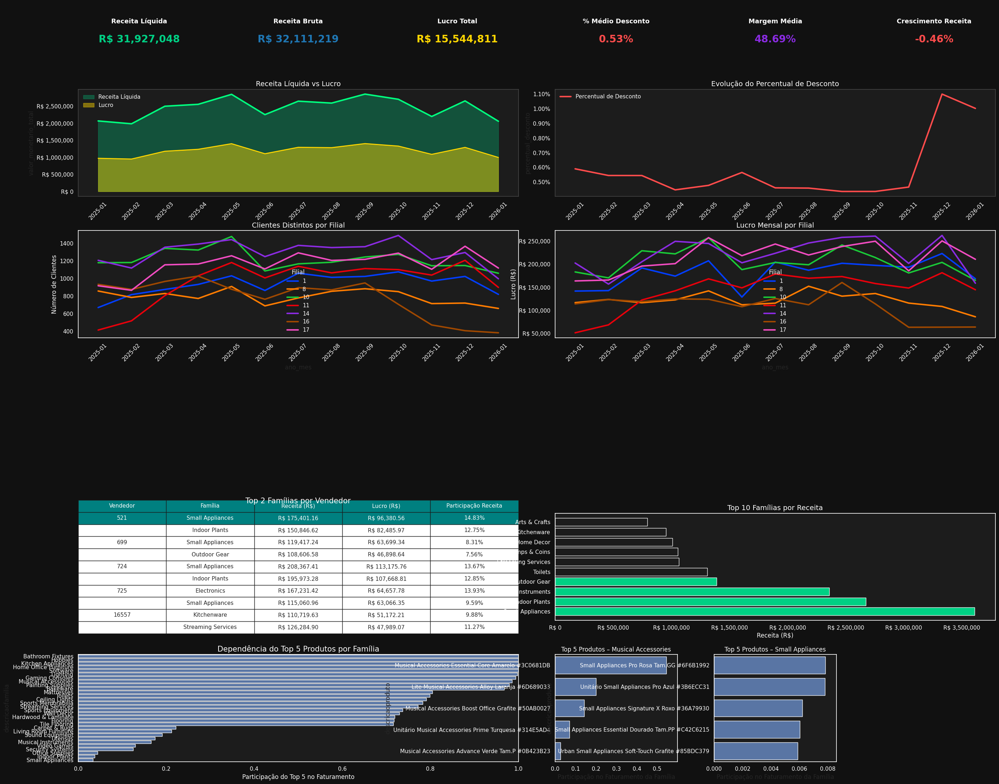

In [56]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as mtick
import pandas as pd
import numpy as np

# ===============================
# ESTILO GERAL
# ===============================
plt.style.use("dark_background")
sns.set_theme(style="dark")

# ===============================
# FIGURA PRINCIPAL
# ===============================
fig = plt.figure(figsize=(28, 22), facecolor="#111111")
gs = fig.add_gridspec(6, 6, height_ratios=[1.2, 2.5, 2.5, 2.5, 2.5, 2.5])

# ===============================
# KPI CARDS
# ===============================
kpis = [
    ("Receita Líquida", f"R$ {base['valor_monetario_total'].sum():,.0f}", "#00D084"),
    ("Receita Bruta", f"R$ {base['faturamento_bruto'].sum():,.0f}", "#1F77B4"),
    ("Lucro Total", f"R$ {base['lucro'].sum():,.0f}", "#FFD700"),
    ("% Médio Desconto", f"{base['percentual_desconto'].mean():.2%}", "#FF4C4C"),
    ("Margem Média", f"{base['lucro'].sum()/base['valor_monetario_total'].sum():.2%}", "#8A2BE2"),
    ("Crescimento Receita", 
     f"{(mensal['valor_monetario_total'].iloc[-1]-mensal['valor_monetario_total'].iloc[0])/mensal['valor_monetario_total'].iloc[0]:.2%}", 
     "#00FF7F" if (mensal['valor_monetario_total'].iloc[-1]-mensal['valor_monetario_total'].iloc[0]) > 0 else "#FF4C4C")
]

for i, (titulo, valor, cor) in enumerate(kpis):
    ax = fig.add_subplot(gs[0, i])
    ax.set_facecolor("#1C1C1C")
    ax.axis("off")
    ax.text(0.5, 0.65, titulo, ha="center", va="center",
            fontsize=13, fontweight="bold", color="white")
    ax.text(0.5, 0.3, valor, ha="center", va="center",
            fontsize=20, fontweight="bold", color=cor)

# ===============================
# RECEITA LÍQUIDA vs LUCRO
# ===============================
ax1 = fig.add_subplot(gs[1, :3])
ax1.set_facecolor("#1C1C1C")
ax1.fill_between(mensal["ano_mes"], mensal["valor_monetario_total"], alpha=0.3, color="#00D084", label="Receita Líquida")
sns.lineplot(data=mensal, x="ano_mes", y="valor_monetario_total", ax=ax1, color="#00FF7F", linewidth=3)
ax1.fill_between(mensal["ano_mes"], mensal["lucro"], alpha=0.45, color="#FFD700", label="Lucro")
sns.lineplot(data=mensal, x="ano_mes", y="lucro", ax=ax1, color="#FFD700", linewidth=2)
ax1.set_title("Receita Líquida vs Lucro", fontsize=14, color="white")
ax1.tick_params(axis='x', rotation=45, colors="white")
ax1.tick_params(axis='y', colors="white")
ax1.legend(frameon=False, facecolor="#1C1C1C", edgecolor="#444444", labelcolor="white")
ax1.yaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
for spine in ax1.spines.values():
    spine.set_color("#444444")

# ===============================
# PERCENTUAL DE DESCONTO
# ===============================
ax2 = fig.add_subplot(gs[1, 3:])
ax2.set_facecolor("#1C1C1C")
sns.lineplot(data=mensal, x="ano_mes", y="percentual_desconto", ax=ax2, color="#FF4C4C", linewidth=3, label="Percentual de Desconto")
ax2.set_title("Evolução do Percentual de Desconto", fontsize=14, color="white")
ax2.tick_params(axis='x', rotation=45, colors="white")
ax2.tick_params(axis='y', colors="white")
ax2.legend(frameon=False, facecolor="#1C1C1C", edgecolor="#444444", labelcolor="white")
ax2.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
for spine in ax2.spines.values():
    spine.set_color("#444444")

# ===============================
# CLIENTES DISTINTOS POR FILIAL
# ===============================
ax3 = fig.add_subplot(gs[2, :3])
ax3.set_facecolor("#1C1C1C")
sns.lineplot(data=filial_mensal, x="ano_mes", y="clientes_distintos", hue="filial_venda",
             palette=cores_filiais, linewidth=3, ax=ax3)
ax3.set_title("Clientes Distintos por Filial", fontsize=14, color="white")
ax3.tick_params(axis='x', rotation=45, colors="white")
ax3.tick_params(axis='y', colors="white")
ax3.set_ylabel("Número de Clientes", color="white")
leg1 = ax3.legend(title="Filial", frameon=False)
plt.setp(leg1.get_texts(), color='white')
plt.setp(leg1.get_title(), color='white')

# ===============================
# LUCRO MENSAL POR FILIAL
# ===============================
ax4 = fig.add_subplot(gs[2, 3:])
ax4.set_facecolor("#1C1C1C")
sns.lineplot(data=filial_mensal, x="ano_mes", y="lucro", hue="filial_venda",
             palette=cores_filiais, linewidth=3, ax=ax4)
ax4.set_title("Lucro Mensal por Filial", fontsize=14, color="white")
ax4.tick_params(axis='x', rotation=45, colors="white")
ax4.tick_params(axis='y', colors="white")
ax4.yaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
ax4.set_ylabel("Lucro (R$)", color="white")
leg2 = ax4.legend(title="Filial", frameon=False)
plt.setp(leg2.get_texts(), color='white')
plt.setp(leg2.get_title(), color='white')

# ===============================
# VENDEDORES – Destaque Top 4
# ===============================
vendedores_destaque = [37, 3, 21, 49]

def cor_vendedor(codigo):
    return "#00FF7F" if codigo in vendedores_destaque else mapa_cores[codigo]

for ax, y_col, x_col, size_col, titulo in zip(
        [ax5, ax6, ax7],
        ["faturamento_bruto","lucro","margem"],
        ["valor_desconto","percentual_desconto_medio","percentual_desconto_medio"],
        ["bubble_size", None, None],
        ["Faturamento Bruto vs Valor de Desconto",
         "Lucro vs Percentual Médio de Desconto",
         "Margem vs Percentual Médio de Desconto"]):
    
    ax.set_facecolor("#1C1C1C")
    for i in range(len(resumo_vendedor)):
        codigo = resumo_vendedor.loc[i, "codigo_vendedor"]
        x_val = resumo_vendedor.loc[i, x_col]
        y_val = resumo_vendedor.loc[i, y_col]
        s_val = resumo_vendedor.loc[i, size_col] if size_col else 400
        ax.scatter(x_val, y_val, s=s_val, color=cor_vendedor(codigo),
                   edgecolor="white", linewidth=0.8, alpha=0.95)
    ax.set_title(titulo, color="white")
    ax.tick_params(colors="white")
    if y_col in ["faturamento_bruto","lucro"]:
        ax.yaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
    if x_col == "valor_desconto":
        ax.xaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
    else:
        ax.xaxis.set_major_formatter(mtick.PercentFormatter(1.0))
    if y_col == "margem":
        ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
    for spine in ax.spines.values():
        spine.set_color("#444444")

# ===============================
# TABELA TOP 2 FAMÍLIAS
# ===============================
ax8 = fig.add_subplot(gs[4, :3])
ax8.axis('off')
ax8.set_facecolor("#1C1C1C")
top2_formatado = top2_familias.copy().sort_values(["codigo_vendedor","lucro"], ascending=[True,False]).reset_index(drop=True)
top2_formatado["codigo_vendedor"] = top2_formatado["codigo_vendedor"].astype(str)
for i in range(1,len(top2_formatado)):
    if top2_formatado.loc[i,"codigo_vendedor"] == top2_formatado.loc[i-1,"codigo_vendedor"]:
        top2_formatado.loc[i,"codigo_vendedor"] = ""
top2_formatado["valor_monetario_total"] = top2_formatado["valor_monetario_total"].map(lambda x: f"R$ {x:,.2f}")
top2_formatado["lucro"] = top2_formatado["lucro"].map(lambda x: f"R$ {x:,.2f}")
top2_formatado["participacao_receita"] = top2_formatado["participacao_receita"].map(lambda x: f"{x:.2%}")
top2_formatado.columns = ["Vendedor","Família","Receita (R$)","Lucro (R$)","Participação Receita"]
tabela = ax8.table(cellText=top2_formatado.values, colLabels=top2_formatado.columns,
                   cellLoc='center', loc='center')
tabela.auto_set_font_size(False)
tabela.set_fontsize(11)
tabela.scale(1,1.8)
# Destaque top 2
for i in range(len(top2_formatado)):
    if i < 2 or top2_formatado.iloc[i,0] in [str(v) for v in vendedores_destaque]:
        for j in range(len(top2_formatado.columns)):
            tabela[(i,j)].set_facecolor("#008080")
            tabela[(i,j)].get_text().set_color("white")
ax8.set_title("Top 2 Famílias por Vendedor", fontsize=15, color="white", pad=20)

# ===============================
# TOP 10 FAMÍLIAS POR RECEITA – cores sem warning
# ===============================
ax9 = fig.add_subplot(gs[4, 3:])
ax9.set_facecolor("#1C1C1C")
cores_barras = ["#00D084" if i<4 else "#1C1C1C" for i in range(len(familia_sorted.head(10)))]
for i, (_, row) in enumerate(familia_sorted.head(10).iterrows()):
    ax9.barh(row["descricaofamilia"], row["valor_monetario_total"], color=cores_barras[i])
ax9.set_title("Top 10 Famílias por Receita", fontsize=14, color="white")
ax9.set_xlabel("Receita (R$)", color="white")
ax9.tick_params(colors="white")
ax9.xaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
for spine in ax9.spines.values():
    spine.set_color("white")

# ===============================
# DEPENDÊNCIA DO TOP 5 PRODUTOS
# ===============================
ax10 = fig.add_subplot(gs[5, :3])
ax10.set_facecolor("#1C1C1C")
sns.barplot(data=dependencia_plot, x="participacao_top5", y="descricaofamilia", ax=ax10)
ax10.set_title("Dependência do Top 5 Produtos por Família", fontsize=15, color="white")
ax10.set_xlabel("Participação do Top 5 no Faturamento", color="white")
ax10.tick_params(colors="white")
ax10.set_xlim(0,1)
for spine in ax10.spines.values():
    spine.set_color("white")

# ===============================
# TOP 5 PRODUTOS MUSICAL / SMALL APPLIANCES
# ===============================
ax11 = fig.add_subplot(gs[5, 3])
ax11.set_facecolor("#1C1C1C")
sns.barplot(data=musical, x="participacao_familia", y="descricaoproduto", ax=ax11)
ax11.set_title("Top 5 Produtos – Musical Accessories", color="white")
ax11.set_xlabel("Participação no Faturamento da Família")
ax11.tick_params(colors="white")
ax11.set_xlim(0, musical["participacao_familia"].max()*1.1)
for spine in ax11.spines.values():
    spine.set_color("white")

ax12 = fig.add_subplot(gs[5, 4])
ax12.set_facecolor("#1C1C1C")
sns.barplot(data=small_appliances, x="participacao_familia", y="descricaoproduto", ax=ax12)
ax12.set_title("Top 5 Produtos – Small Appliances", color="white")
ax12.set_xlabel("Participação no Faturamento da Família")
ax12.tick_params(colors="white")
ax12.set_xlim(0, small_appliances["participacao_familia"].max()*1.1)
for spine in ax12.spines.values():
    spine.set_color("white")

plt.tight_layout()
plt.subplots_adjust(hspace=0.35, wspace=0.3)
plt.show()


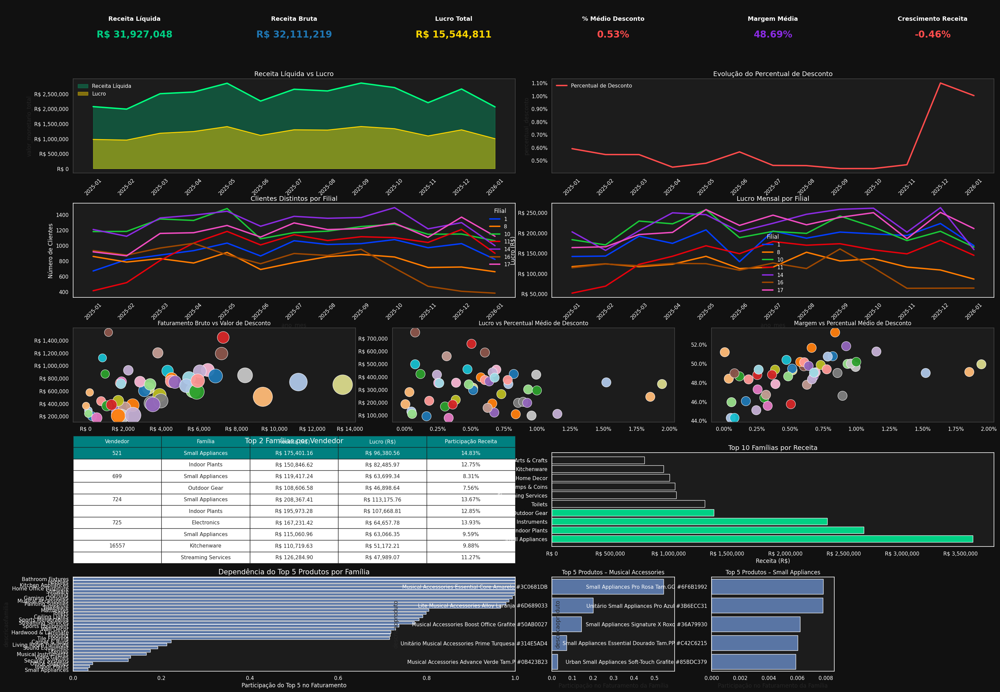

In [57]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as mtick
import pandas as pd
import numpy as np

# ===============================
# ESTILO GERAL
# ===============================
plt.style.use("dark_background")
sns.set_theme(style="dark")

# ===============================
# FIGURA PRINCIPAL
# ===============================
fig = plt.figure(figsize=(30, 24), facecolor="#111111")
gs = fig.add_gridspec(7, 6, height_ratios=[1.2, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5])

# ===============================
# KPI CARDS
# ===============================
kpis = [
    ("Receita Líquida", f"R$ {base['valor_monetario_total'].sum():,.0f}", "#00D084"),
    ("Receita Bruta", f"R$ {base['faturamento_bruto'].sum():,.0f}", "#1F77B4"),
    ("Lucro Total", f"R$ {base['lucro'].sum():,.0f}", "#FFD700"),
    ("% Médio Desconto", f"{base['percentual_desconto'].mean():.2%}", "#FF4C4C"),
    ("Margem Média", f"{base['lucro'].sum()/base['valor_monetario_total'].sum():.2%}", "#8A2BE2"),
    ("Crescimento Receita", 
     f"{(mensal['valor_monetario_total'].iloc[-1]-mensal['valor_monetario_total'].iloc[0])/mensal['valor_monetario_total'].iloc[0]:.2%}", 
     "#00FF7F" if (mensal['valor_monetario_total'].iloc[-1]-mensal['valor_monetario_total'].iloc[0]) > 0 else "#FF4C4C")
]

for i, (titulo, valor, cor) in enumerate(kpis):
    ax = fig.add_subplot(gs[0, i])
    ax.set_facecolor("#1C1C1C")
    ax.axis("off")
    ax.text(0.5, 0.65, titulo, ha="center", va="center",
            fontsize=13, fontweight="bold", color="white")
    ax.text(0.5, 0.3, valor, ha="center", va="center",
            fontsize=20, fontweight="bold", color=cor)

# ===============================
# RECEITA LÍQUIDA vs LUCRO
# ===============================
ax1 = fig.add_subplot(gs[1, :3])
ax1.set_facecolor("#1C1C1C")
ax1.fill_between(mensal["ano_mes"], mensal["valor_monetario_total"], alpha=0.3, color="#00D084", label="Receita Líquida")
sns.lineplot(data=mensal, x="ano_mes", y="valor_monetario_total", ax=ax1, color="#00FF7F", linewidth=3)
ax1.fill_between(mensal["ano_mes"], mensal["lucro"], alpha=0.45, color="#FFD700", label="Lucro")
sns.lineplot(data=mensal, x="ano_mes", y="lucro", ax=ax1, color="#FFD700", linewidth=2)
ax1.set_title("Receita Líquida vs Lucro", fontsize=14, color="white")
ax1.tick_params(axis='x', rotation=45, colors="white")
ax1.tick_params(axis='y', colors="white")
ax1.legend(frameon=False, facecolor="#1C1C1C", edgecolor="#444444", labelcolor="white")
ax1.yaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
for spine in ax1.spines.values():
    spine.set_color("#444444")

# ===============================
# PERCENTUAL DE DESCONTO
# ===============================
ax2 = fig.add_subplot(gs[1, 3:])
ax2.set_facecolor("#1C1C1C")
sns.lineplot(data=mensal, x="ano_mes", y="percentual_desconto", ax=ax2, color="#FF4C4C", linewidth=3, label="Percentual de Desconto")
ax2.set_title("Evolução do Percentual de Desconto", fontsize=14, color="white")
ax2.tick_params(axis='x', rotation=45, colors="white")
ax2.tick_params(axis='y', colors="white")
ax2.legend(frameon=False, facecolor="#1C1C1C", edgecolor="#444444", labelcolor="white")
ax2.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
for spine in ax2.spines.values():
    spine.set_color("#444444")

# ===============================
# CLIENTES DISTINTOS POR FILIAL
# ===============================
ax3 = fig.add_subplot(gs[2, :3])
ax3.set_facecolor("#1C1C1C")
sns.lineplot(data=filial_mensal, x="ano_mes", y="clientes_distintos", hue="filial_venda",
             palette=cores_filiais, linewidth=3, ax=ax3)
ax3.set_title("Clientes Distintos por Filial", fontsize=14, color="white")
ax3.tick_params(axis='x', rotation=45, colors="white")
ax3.tick_params(axis='y', colors="white")
ax3.set_ylabel("Número de Clientes", color="white")
leg1 = ax3.legend(title="Filial", frameon=False)
plt.setp(leg1.get_texts(), color='white')
plt.setp(leg1.get_title(), color='white')

# ===============================
# LUCRO MENSAL POR FILIAL
# ===============================
ax4 = fig.add_subplot(gs[2, 3:])
ax4.set_facecolor("#1C1C1C")
sns.lineplot(data=filial_mensal, x="ano_mes", y="lucro", hue="filial_venda",
             palette=cores_filiais, linewidth=3, ax=ax4)
ax4.set_title("Lucro Mensal por Filial", fontsize=14, color="white")
ax4.tick_params(axis='x', rotation=45, colors="white")
ax4.tick_params(axis='y', colors="white")
ax4.yaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
ax4.set_ylabel("Lucro (R$)", color="white")
leg2 = ax4.legend(title="Filial", frameon=False)
plt.setp(leg2.get_texts(), color='white')
plt.setp(leg2.get_title(), color='white')

# ===============================
# SCATTER PLOTS VENDEDORES (Top 4 destacados)
# ===============================
vendedores_destaque = [37, 3, 21, 49]

def cor_vendedor(codigo):
    return "#00FF7F" if codigo in vendedores_destaque else mapa_cores[codigo]

ax5 = fig.add_subplot(gs[3, :2])
ax6 = fig.add_subplot(gs[3, 2:4])
ax7 = fig.add_subplot(gs[3, 4:])

for ax, y_col, x_col, size_col, titulo in zip(
        [ax5, ax6, ax7],
        ["faturamento_bruto","lucro","margem"],
        ["valor_desconto","percentual_desconto_medio","percentual_desconto_medio"],
        ["bubble_size", None, None],
        ["Faturamento Bruto vs Valor de Desconto",
         "Lucro vs Percentual Médio de Desconto",
         "Margem vs Percentual Médio de Desconto"]):
    
    ax.set_facecolor("#1C1C1C")
    for i in range(len(resumo_vendedor)):
        codigo = resumo_vendedor.loc[i, "codigo_vendedor"]
        x_val = resumo_vendedor.loc[i, x_col]
        y_val = resumo_vendedor.loc[i, y_col]
        s_val = resumo_vendedor.loc[i, size_col] if size_col else 400
        ax.scatter(x_val, y_val, s=s_val, color=cor_vendedor(codigo),
                   edgecolor="white", linewidth=0.8, alpha=0.95)
    ax.set_title(titulo, color="white")
    ax.tick_params(colors="white")
    if y_col in ["faturamento_bruto","lucro"]:
        ax.yaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
    if x_col == "valor_desconto":
        ax.xaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
    else:
        ax.xaxis.set_major_formatter(mtick.PercentFormatter(1.0))
    if y_col == "margem":
        ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
    for spine in ax.spines.values():
        spine.set_color("#444444")

# ===============================
# TABELA TOP 2 FAMÍLIAS
# ===============================
ax8 = fig.add_subplot(gs[4, :3])
ax8.axis('off')
ax8.set_facecolor("#1C1C1C")
top2_formatado = top2_familias.copy().sort_values(["codigo_vendedor","lucro"], ascending=[True,False]).reset_index(drop=True)
top2_formatado["codigo_vendedor"] = top2_formatado["codigo_vendedor"].astype(str)
for i in range(1,len(top2_formatado)):
    if top2_formatado.loc[i,"codigo_vendedor"] == top2_formatado.loc[i-1,"codigo_vendedor"]:
        top2_formatado.loc[i,"codigo_vendedor"] = ""
top2_formatado["valor_monetario_total"] = top2_formatado["valor_monetario_total"].map(lambda x: f"R$ {x:,.2f}")
top2_formatado["lucro"] = top2_formatado["lucro"].map(lambda x: f"R$ {x:,.2f}")
top2_formatado["participacao_receita"] = top2_formatado["participacao_receita"].map(lambda x: f"{x:.2%}")
top2_formatado.columns = ["Vendedor","Família","Receita (R$)","Lucro (R$)","Participação Receita"]
tabela = ax8.table(cellText=top2_formatado.values, colLabels=top2_formatado.columns,
                   cellLoc='center', loc='center')
tabela.auto_set_font_size(False)
tabela.set_fontsize(11)
tabela.scale(1,1.8)
# Destaque top 2
for i in range(len(top2_formatado)):
    if i < 2 or top2_formatado.iloc[i,0] in [str(v) for v in vendedores_destaque]:
        for j in range(len(top2_formatado.columns)):
            tabela[(i,j)].set_facecolor("#008080")
            tabela[(i,j)].get_text().set_color("white")
ax8.set_title("Top 2 Famílias por Vendedor", fontsize=15, color="white", pad=20)

# ===============================
# TOP 10 FAMÍLIAS POR RECEITA
# ===============================
ax9 = fig.add_subplot(gs[4, 3:])
ax9.set_facecolor("#1C1C1C")
cores_barras = ["#00D084" if i<4 else "#1C1C1C" for i in range(len(familia_sorted.head(10)))]
for i, (_, row) in enumerate(familia_sorted.head(10).iterrows()):
    ax9.barh(row["descricaofamilia"], row["valor_monetario_total"], color=cores_barras[i])
ax9.set_title("Top 10 Famílias por Receita", fontsize=14, color="white")
ax9.set_xlabel("Receita (R$)", color="white")
ax9.tick_params(colors="white")
ax9.xaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
for spine in ax9.spines.values():
    spine.set_color("white")

# ===============================
# DEPENDÊNCIA DO TOP 5 PRODUTOS
# ===============================
ax10 = fig.add_subplot(gs[5, :3])
ax10.set_facecolor("#1C1C1C")
sns.barplot(data=dependencia_plot, x="participacao_top5", y="descricaofamilia", ax=ax10)
ax10.set_title("Dependência do Top 5 Produtos por Família", fontsize=15, color="white")
ax10.set_xlabel("Participação do Top 5 no Faturamento", color="white")
ax10.tick_params(colors="white")
ax10.set_xlim(0,1)
for spine in ax10.spines.values():
    spine.set_color("white")

# ===============================
# TOP 5 PRODUTOS MUSICAL / SMALL APPLIANCES
# ===============================
ax11 = fig.add_subplot(gs[5, 3])
ax11.set_facecolor("#1C1C1C")
sns.barplot(data=musical, x="participacao_familia", y="descricaoproduto", ax=ax11)
ax11.set_title("Top 5 Produtos – Musical Accessories", color="white")
ax11.set_xlabel("Participação no Faturamento da Família")
ax11.tick_params(colors="white")
ax11.set_xlim(0, musical["participacao_familia"].max()*1.1)
for spine in ax11.spines.values():
    spine.set_color("white")

ax12 = fig.add_subplot(gs[5, 4])
ax12.set_facecolor("#1C1C1C")
sns.barplot(data=small_appliances, x="participacao_familia", y="descricaoproduto", ax=ax12)
ax12.set_title("Top 5 Produtos – Small Appliances", color="white")
ax12.set_xlabel("Participação no Faturamento da Família")
ax12.tick_params(colors="white")
ax12.set_xlim(0, small_appliances["participacao_familia"].max()*1.1)
for spine in ax12.spines.values():
    spine.set_color("white")

plt.tight_layout()
plt.subplots_adjust(hspace=0.35, wspace=0.3)
plt.show()


/tmp/ipykernel_7731/1349203423.py:154: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=familia_sorted.head(10), x="valor_monetario_total", y="descricaofamilia", palette=sns.light_palette("#00D084", n_colors=10, reverse=True), ax=ax9)


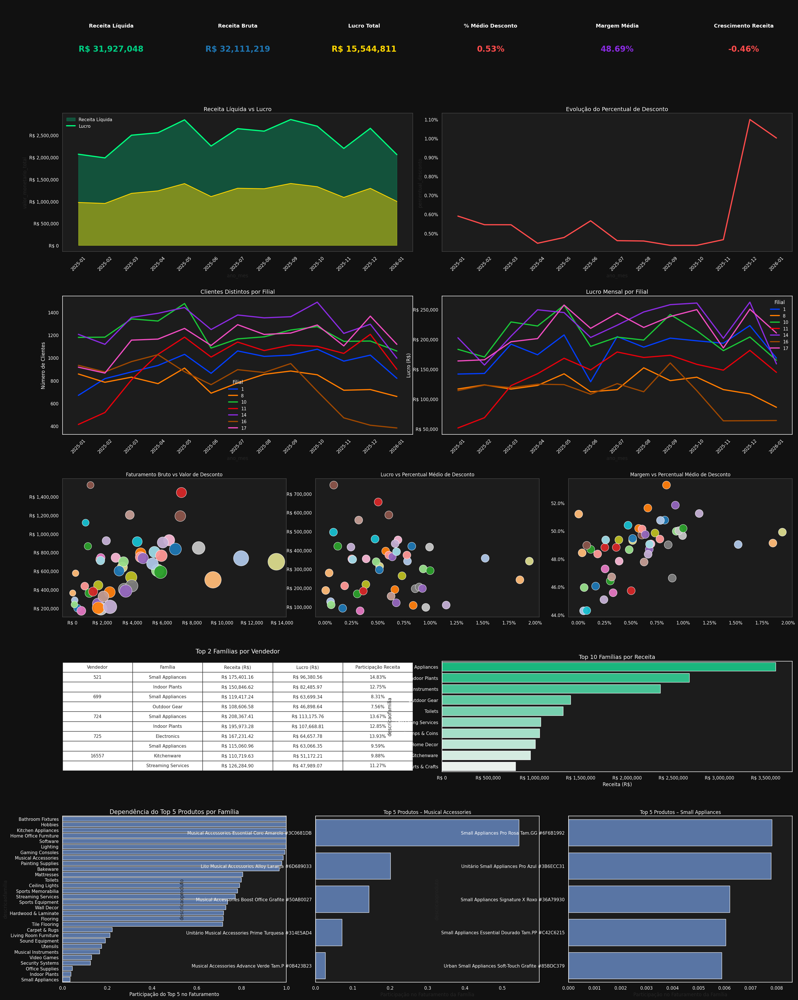

In [58]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as mtick
import pandas as pd
import numpy as np

plt.style.use("dark_background")
sns.set_theme(style="dark")

# ===============================
# FIGURA PRINCIPAL OTIMIZADA
# ===============================
fig = plt.figure(figsize=(28, 35), facecolor="#111111")
gs = fig.add_gridspec(6, 6, height_ratios=[1.2, 2.5, 2.5, 2.5, 2.0, 3.0])

# ===============================
# 1️⃣ KPIs
# ===============================
kpis = [
    ("Receita Líquida", f"R$ {base['valor_monetario_total'].sum():,.0f}", "#00D084"),
    ("Receita Bruta", f"R$ {base['faturamento_bruto'].sum():,.0f}", "#1F77B4"),
    ("Lucro Total", f"R$ {base['lucro'].sum():,.0f}", "#FFD700"),
    ("% Médio Desconto", f"{base['percentual_desconto'].mean():.2%}", "#FF4C4C"),
    ("Margem Média", f"{base['lucro'].sum()/base['valor_monetario_total'].sum():.2%}", "#8A2BE2"),
    ("Crescimento Receita", 
     f"{(mensal['valor_monetario_total'].iloc[-1]-mensal['valor_monetario_total'].iloc[0])/mensal['valor_monetario_total'].iloc[0]:.2%}", 
     "#00FF7F" if (mensal['valor_monetario_total'].iloc[-1]-mensal['valor_monetario_total'].iloc[0]) > 0 else "#FF4C4C")
]

for i, (titulo, valor, cor) in enumerate(kpis):
    ax = fig.add_subplot(gs[0, i])
    ax.set_facecolor("#1C1C1C")
    ax.axis("off")
    ax.text(0.5, 0.65, titulo, ha="center", va="center",
            fontsize=13, fontweight="bold", color="white")
    ax.text(0.5, 0.3, valor, ha="center", va="center",
            fontsize=20, fontweight="bold", color=cor)

# ===============================
# 2️⃣ Receita Líquida vs Lucro / Percentual de Desconto
# ===============================
ax1 = fig.add_subplot(gs[1, :3])
ax2 = fig.add_subplot(gs[1, 3:])

for ax in [ax1, ax2]:
    ax.set_facecolor("#1C1C1C")

# Receita vs Lucro
ax1.fill_between(mensal["ano_mes"], mensal["valor_monetario_total"], alpha=0.3, color="#00D084")
sns.lineplot(data=mensal, x="ano_mes", y="valor_monetario_total", ax=ax1, color="#00FF7F", linewidth=3)
ax1.fill_between(mensal["ano_mes"], mensal["lucro"], alpha=0.45, color="#FFD700")
sns.lineplot(data=mensal, x="ano_mes", y="lucro", ax=ax1, color="#FFD700", linewidth=2)
ax1.set_title("Receita Líquida vs Lucro", fontsize=14, color="white")
ax1.tick_params(axis='x', rotation=45, colors="white")
ax1.tick_params(axis='y', colors="white")
ax1.yaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
ax1.legend(["Receita Líquida","Lucro"], frameon=False, facecolor="#1C1C1C", edgecolor="#444444", labelcolor="white")
for spine in ax1.spines.values(): spine.set_color("#444444")

# Percentual de Desconto
sns.lineplot(data=mensal, x="ano_mes", y="percentual_desconto", ax=ax2, color="#FF4C4C", linewidth=3)
ax2.set_title("Evolução do Percentual de Desconto", fontsize=14, color="white")
ax2.tick_params(axis='x', rotation=45, colors="white")
ax2.tick_params(axis='y', colors="white")
ax2.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
for spine in ax2.spines.values(): spine.set_color("#444444")

# ===============================
# 3️⃣ Clientes e Lucro por Filial
# ===============================
ax3 = fig.add_subplot(gs[2, :3])
ax4 = fig.add_subplot(gs[2, 3:])

for ax in [ax3, ax4]: ax.set_facecolor("#1C1C1C")

sns.lineplot(data=filial_mensal, x="ano_mes", y="clientes_distintos", hue="filial_venda",
             palette=cores_filiais, linewidth=3, ax=ax3)
ax3.set_title("Clientes Distintos por Filial", fontsize=14, color="white")
ax3.tick_params(axis='x', rotation=45, colors="white")
ax3.tick_params(axis='y', colors="white")
ax3.set_ylabel("Número de Clientes", color="white")
leg1 = ax3.legend(title="Filial", frameon=False)
plt.setp(leg1.get_texts(), color='white')
plt.setp(leg1.get_title(), color='white')

sns.lineplot(data=filial_mensal, x="ano_mes", y="lucro", hue="filial_venda",
             palette=cores_filiais, linewidth=3, ax=ax4)
ax4.set_title("Lucro Mensal por Filial", fontsize=14, color="white")
ax4.tick_params(axis='x', rotation=45, colors="white")
ax4.tick_params(axis='y', colors="white")
ax4.yaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
ax4.set_ylabel("Lucro (R$)", color="white")
leg2 = ax4.legend(title="Filial", frameon=False)
plt.setp(leg2.get_texts(), color='white')
plt.setp(leg2.get_title(), color='white')

# ===============================
# 4️⃣ Scatterplots Vendedores (todos lado a lado)
# ===============================
ax5 = fig.add_subplot(gs[3, :2])
ax6 = fig.add_subplot(gs[3, 2:4])
ax7 = fig.add_subplot(gs[3, 4:])

for ax in [ax5, ax6, ax7]: ax.set_facecolor("#1C1C1C")

vendedores_destaque = [37,3,21,49]
def cor_vendedor(codigo):
    return "#00FF7F" if codigo in vendedores_destaque else mapa_cores[codigo]

scatter_configs = [
    ("faturamento_bruto","valor_desconto","bubble_size","Faturamento Bruto vs Valor de Desconto"),
    ("lucro","percentual_desconto_medio",None,"Lucro vs Percentual Médio de Desconto"),
    ("margem","percentual_desconto_medio",None,"Margem vs Percentual Médio de Desconto")
]

for ax, (y_col,x_col,size_col,titulo) in zip([ax5,ax6,ax7], scatter_configs):
    for i in range(len(resumo_vendedor)):
        codigo = resumo_vendedor.loc[i,"codigo_vendedor"]
        x_val = resumo_vendedor.loc[i,x_col]
        y_val = resumo_vendedor.loc[i,y_col]
        s_val = resumo_vendedor.loc[i,size_col] if size_col else 400
        ax.scatter(x_val,y_val,s=s_val,color=cor_vendedor(codigo),
                   edgecolor="white", linewidth=0.8, alpha=0.95)
    ax.set_title(titulo,color="white")
    ax.tick_params(colors="white")
    if y_col in ["faturamento_bruto","lucro"]: ax.yaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
    if x_col=="valor_desconto": ax.xaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
    else: ax.xaxis.set_major_formatter(mtick.PercentFormatter(1.0))
    if y_col=="margem": ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
    for spine in ax.spines.values(): spine.set_color("#444444")

# ===============================
# 5️⃣ Top 2 Famílias + Top 10 Famílias
# ===============================
ax8 = fig.add_subplot(gs[4, :3])
ax8.axis('off')
ax8.set_facecolor("#1C1C1C")
top2_formatado = top2_familias.copy().sort_values(["codigo_vendedor","lucro"], ascending=[True,False]).reset_index(drop=True)
top2_formatado["codigo_vendedor"] = top2_formatado["codigo_vendedor"].astype(str)
for i in range(1,len(top2_formatado)):
    if top2_formatado.loc[i,"codigo_vendedor"]==top2_formatado.loc[i-1,"codigo_vendedor"]: top2_formatado.loc[i,"codigo_vendedor"]=""
top2_formatado["valor_monetario_total"] = top2_formatado["valor_monetario_total"].map(lambda x: f"R$ {x:,.2f}")
top2_formatado["lucro"] = top2_formatado["lucro"].map(lambda x: f"R$ {x:,.2f}")
top2_formatado["participacao_receita"] = top2_formatado["participacao_receita"].map(lambda x: f"{x:.2%}")
top2_formatado.columns = ["Vendedor","Família","Receita (R$)","Lucro (R$)","Participação Receita"]
tabela = ax8.table(cellText=top2_formatado.values, colLabels=top2_formatado.columns, cellLoc='center', loc='center')
tabela.auto_set_font_size(False)
tabela.set_fontsize(11)
tabela.scale(1,1.8)
ax8.set_title("Top 2 Famílias por Vendedor", fontsize=15, color="white", pad=20)

ax9 = fig.add_subplot(gs[4, 3:])
ax9.set_facecolor("#1C1C1C")
sns.barplot(data=familia_sorted.head(10), x="valor_monetario_total", y="descricaofamilia", palette=sns.light_palette("#00D084", n_colors=10, reverse=True), ax=ax9)
ax9.set_title("Top 10 Famílias por Receita", fontsize=14, color="white")
ax9.set_xlabel("Receita (R$)", color="white")
ax9.tick_params(colors="white")
ax9.xaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
for spine in ax9.spines.values(): spine.set_color("white")

# ===============================
# 6️⃣ Dependência do Top 5 + Produtos Musical / Small Appliances
# ===============================
ax10 = fig.add_subplot(gs[5, :2])
ax11 = fig.add_subplot(gs[5, 2:4])
ax12 = fig.add_subplot(gs[5, 4:])
for ax in [ax10,ax11,ax12]: ax.set_facecolor("#1C1C1C")

sns.barplot(data=dependencia_plot, x="participacao_top5", y="descricaofamilia", ax=ax10)
ax10.set_title("Dependência do Top 5 Produtos por Família", fontsize=15, color="white")
ax10.set_xlabel("Participação do Top 5 no Faturamento", color="white")
ax10.tick_params(colors="white")
ax10.set_xlim(0,1)
for spine in ax10.spines.values(): spine.set_color("white")

sns.barplot(data=musical, x="participacao_familia", y="descricaoproduto", ax=ax11)
ax11.set_title("Top 5 Produtos – Musical Accessories", color="white")
ax11.set_xlabel("Participação no Faturamento da Família")
ax11.tick_params(colors="white")
ax11.set_xlim(0, musical["participacao_familia"].max()*1.1)
for spine in ax11.spines.values(): spine.set_color("white")

sns.barplot(data=small_appliances, x="participacao_familia", y="descricaoproduto", ax=ax12)
ax12.set_title("Top 5 Produtos – Small Appliances", color="white")
ax12.set_xlabel("Participação no Faturamento da Família")
ax12.tick_params(colors="white")
ax12.set_xlim(0, small_appliances["participacao_familia"].max()*1.1)
for spine in ax12.spines.values(): spine.set_color("white")

plt.tight_layout()
plt.subplots_adjust(hspace=0.35, wspace=0.3)
plt.show()


/tmp/ipykernel_7731/2007390992.py:154: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=familia_sorted.head(10), x="valor_monetario_total", y="descricaofamilia", palette=sns.light_palette("#00D084", n_colors=10, reverse=True), ax=ax9)


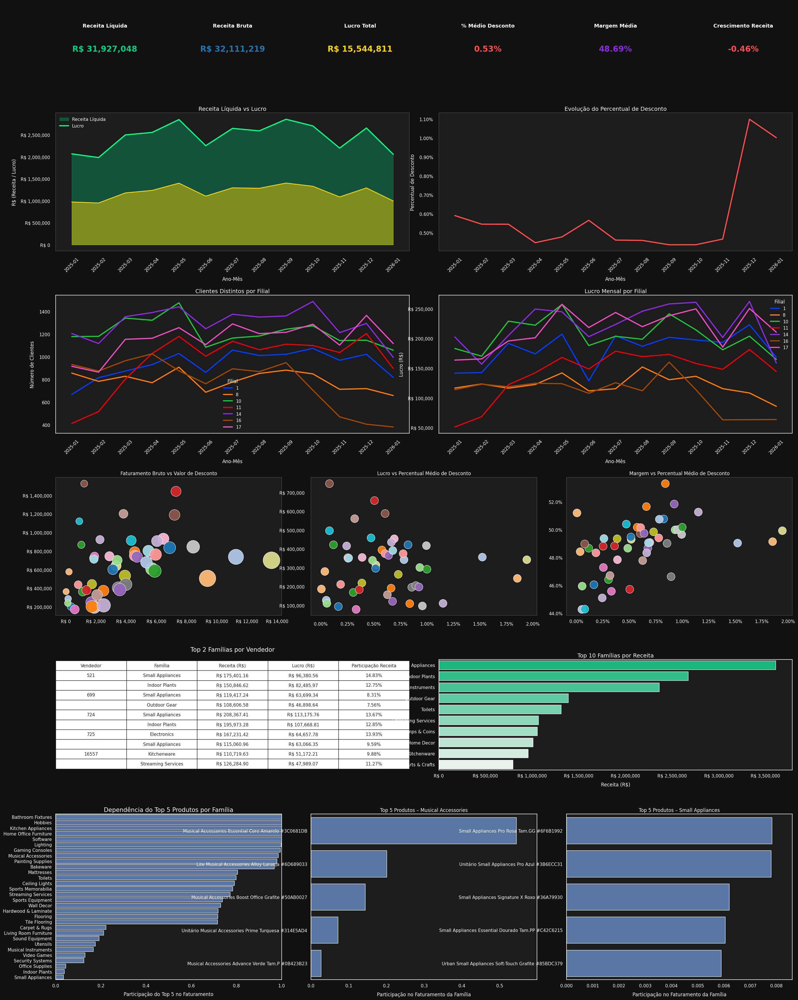

In [59]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as mtick
import pandas as pd
import numpy as np

plt.style.use("dark_background")
sns.set_theme(style="dark")

# ===============================
# FIGURA PRINCIPAL OTIMIZADA
# ===============================
fig = plt.figure(figsize=(28, 35), facecolor="#111111")
gs = fig.add_gridspec(6, 6, height_ratios=[1.2, 2.5, 2.5, 2.5, 2.0, 3.0])

# ===============================
# 1️⃣ KPIs
# ===============================
kpis = [
    ("Receita Líquida", f"R$ {base['valor_monetario_total'].sum():,.0f}", "#00D084"),
    ("Receita Bruta", f"R$ {base['faturamento_bruto'].sum():,.0f}", "#1F77B4"),
    ("Lucro Total", f"R$ {base['lucro'].sum():,.0f}", "#FFD700"),
    ("% Médio Desconto", f"{base['percentual_desconto'].mean():.2%}", "#FF4C4C"),
    ("Margem Média", f"{base['lucro'].sum()/base['valor_monetario_total'].sum():.2%}", "#8A2BE2"),
    ("Crescimento Receita", 
     f"{(mensal['valor_monetario_total'].iloc[-1]-mensal['valor_monetario_total'].iloc[0])/mensal['valor_monetario_total'].iloc[0]:.2%}", 
     "#00FF7F" if (mensal['valor_monetario_total'].iloc[-1]-mensal['valor_monetario_total'].iloc[0]) > 0 else "#FF4C4C")
]

for i, (titulo, valor, cor) in enumerate(kpis):
    ax = fig.add_subplot(gs[0, i])
    ax.set_facecolor("#1C1C1C")
    ax.axis("off")
    ax.text(0.5, 0.65, titulo, ha="center", va="center",
            fontsize=13, fontweight="bold", color="white")
    ax.text(0.5, 0.3, valor, ha="center", va="center",
            fontsize=20, fontweight="bold", color=cor)

# ===============================
# 2️⃣ Receita Líquida vs Lucro / Percentual de Desconto
# ===============================
ax1 = fig.add_subplot(gs[1, :3])
ax2 = fig.add_subplot(gs[1, 3:])

for ax in [ax1, ax2]:
    ax.set_facecolor("#1C1C1C")

# Receita vs Lucro
ax1.fill_between(mensal["ano_mes"], mensal["valor_monetario_total"], alpha=0.3, color="#00D084")
sns.lineplot(data=mensal, x="ano_mes", y="valor_monetario_total", ax=ax1, color="#00FF7F", linewidth=3)
ax1.fill_between(mensal["ano_mes"], mensal["lucro"], alpha=0.45, color="#FFD700")
sns.lineplot(data=mensal, x="ano_mes", y="lucro", ax=ax1, color="#FFD700", linewidth=2)
ax1.set_title("Receita Líquida vs Lucro", fontsize=14, color="white")
ax1.tick_params(axis='x', rotation=45, colors="white")
ax1.tick_params(axis='y', colors="white")
ax1.yaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
ax1.legend(["Receita Líquida","Lucro"], frameon=False, facecolor="#1C1C1C", edgecolor="#444444", labelcolor="white")
for spine in ax1.spines.values(): spine.set_color("#444444")

# Percentual de Desconto
sns.lineplot(data=mensal, x="ano_mes", y="percentual_desconto", ax=ax2, color="#FF4C4C", linewidth=3)
ax2.set_title("Evolução do Percentual de Desconto", fontsize=14, color="white")
ax2.tick_params(axis='x', rotation=45, colors="white")
ax2.tick_params(axis='y', colors="white")
ax2.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
for spine in ax2.spines.values(): spine.set_color("#444444")

# ===============================
# 3️⃣ Clientes e Lucro por Filial
# ===============================
ax3 = fig.add_subplot(gs[2, :3])
ax4 = fig.add_subplot(gs[2, 3:])

for ax in [ax3, ax4]: ax.set_facecolor("#1C1C1C")

sns.lineplot(data=filial_mensal, x="ano_mes", y="clientes_distintos", hue="filial_venda",
             palette=cores_filiais, linewidth=3, ax=ax3)
ax3.set_title("Clientes Distintos por Filial", fontsize=14, color="white")
ax3.tick_params(axis='x', rotation=45, colors="white")
ax3.tick_params(axis='y', colors="white")
ax3.set_ylabel("Número de Clientes", color="white")
leg1 = ax3.legend(title="Filial", frameon=False)
plt.setp(leg1.get_texts(), color='white')
plt.setp(leg1.get_title(), color='white')

sns.lineplot(data=filial_mensal, x="ano_mes", y="lucro", hue="filial_venda",
             palette=cores_filiais, linewidth=3, ax=ax4)
ax4.set_title("Lucro Mensal por Filial", fontsize=14, color="white")
ax4.tick_params(axis='x', rotation=45, colors="white")
ax4.tick_params(axis='y', colors="white")
ax4.yaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
ax4.set_ylabel("Lucro (R$)", color="white")
leg2 = ax4.legend(title="Filial", frameon=False)
plt.setp(leg2.get_texts(), color='white')
plt.setp(leg2.get_title(), color='white')

# ===============================
# 4️⃣ Scatterplots Vendedores (todos lado a lado)
# ===============================
ax5 = fig.add_subplot(gs[3, :2])
ax6 = fig.add_subplot(gs[3, 2:4])
ax7 = fig.add_subplot(gs[3, 4:])

for ax in [ax5, ax6, ax7]: ax.set_facecolor("#1C1C1C")

vendedores_destaque = [37,3,21,49]
def cor_vendedor(codigo):
    return "#00FF7F" if codigo in vendedores_destaque else mapa_cores[codigo]

scatter_configs = [
    ("faturamento_bruto","valor_desconto","bubble_size","Faturamento Bruto vs Valor de Desconto"),
    ("lucro","percentual_desconto_medio",None,"Lucro vs Percentual Médio de Desconto"),
    ("margem","percentual_desconto_medio",None,"Margem vs Percentual Médio de Desconto")
]

for ax, (y_col,x_col,size_col,titulo) in zip([ax5,ax6,ax7], scatter_configs):
    for i in range(len(resumo_vendedor)):
        codigo = resumo_vendedor.loc[i,"codigo_vendedor"]
        x_val = resumo_vendedor.loc[i,x_col]
        y_val = resumo_vendedor.loc[i,y_col]
        s_val = resumo_vendedor.loc[i,size_col] if size_col else 400
        ax.scatter(x_val,y_val,s=s_val,color=cor_vendedor(codigo),
                   edgecolor="white", linewidth=0.8, alpha=0.95)
    ax.set_title(titulo,color="white")
    ax.tick_params(colors="white")
    if y_col in ["faturamento_bruto","lucro"]: ax.yaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
    if x_col=="valor_desconto": ax.xaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
    else: ax.xaxis.set_major_formatter(mtick.PercentFormatter(1.0))
    if y_col=="margem": ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
    for spine in ax.spines.values(): spine.set_color("#444444")

# ===============================
# 5️⃣ Top 2 Famílias + Top 10 Famílias
# ===============================
ax8 = fig.add_subplot(gs[4, :3])
ax8.axis('off')
ax8.set_facecolor("#1C1C1C")
top2_formatado = top2_familias.copy().sort_values(["codigo_vendedor","lucro"], ascending=[True,False]).reset_index(drop=True)
top2_formatado["codigo_vendedor"] = top2_formatado["codigo_vendedor"].astype(str)
for i in range(1,len(top2_formatado)):
    if top2_formatado.loc[i,"codigo_vendedor"]==top2_formatado.loc[i-1,"codigo_vendedor"]: top2_formatado.loc[i,"codigo_vendedor"]=""
top2_formatado["valor_monetario_total"] = top2_formatado["valor_monetario_total"].map(lambda x: f"R$ {x:,.2f}")
top2_formatado["lucro"] = top2_formatado["lucro"].map(lambda x: f"R$ {x:,.2f}")
top2_formatado["participacao_receita"] = top2_formatado["participacao_receita"].map(lambda x: f"{x:.2%}")
top2_formatado.columns = ["Vendedor","Família","Receita (R$)","Lucro (R$)","Participação Receita"]
tabela = ax8.table(cellText=top2_formatado.values, colLabels=top2_formatado.columns, cellLoc='center', loc='center')
tabela.auto_set_font_size(False)
tabela.set_fontsize(11)
tabela.scale(1,1.8)
ax8.set_title("Top 2 Famílias por Vendedor", fontsize=15, color="white", pad=20)

ax9 = fig.add_subplot(gs[4, 3:])
ax9.set_facecolor("#1C1C1C")
sns.barplot(data=familia_sorted.head(10), x="valor_monetario_total", y="descricaofamilia", palette=sns.light_palette("#00D084", n_colors=10, reverse=True), ax=ax9)
ax9.set_title("Top 10 Famílias por Receita", fontsize=14, color="white")
ax9.set_xlabel("Receita (R$)", color="white")
ax9.tick_params(colors="white")
ax9.xaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
for spine in ax9.spines.values(): spine.set_color("white")

# ===============================
# 6️⃣ Dependência do Top 5 + Produtos Musical / Small Appliances
# ===============================
ax10 = fig.add_subplot(gs[5, :2])
ax11 = fig.add_subplot(gs[5, 2:4])
ax12 = fig.add_subplot(gs[5, 4:])
for ax in [ax10,ax11,ax12]: ax.set_facecolor("#1C1C1C")

sns.barplot(data=dependencia_plot, x="participacao_top5", y="descricaofamilia", ax=ax10)
ax10.set_title("Dependência do Top 5 Produtos por Família", fontsize=15, color="white")
ax10.set_xlabel("Participação do Top 5 no Faturamento", color="white")
ax10.tick_params(colors="white")
ax10.set_xlim(0,1)
for spine in ax10.spines.values(): spine.set_color("white")

sns.barplot(data=musical, x="participacao_familia", y="descricaoproduto", ax=ax11)
ax11.set_title("Top 5 Produtos – Musical Accessories", color="white")
ax11.set_xlabel("Participação no Faturamento da Família")
ax11.tick_params(colors="white")
ax11.set_xlim(0, musical["participacao_familia"].max()*1.1)
for spine in ax11.spines.values(): spine.set_color("white")

sns.barplot(data=small_appliances, x="participacao_familia", y="descricaoproduto", ax=ax12)
ax12.set_title("Top 5 Produtos – Small Appliances", color="white")
ax12.set_xlabel("Participação no Faturamento da Família")
ax12.tick_params(colors="white")
ax12.set_xlim(0, small_appliances["participacao_familia"].max()*1.1)
for spine in ax12.spines.values(): spine.set_color("white")

# ===============================
# Correção de labels e ticks
# ===============================

# ax1 - Receita Líquida vs Lucro
ax1.set_xlabel("Ano-Mês", color="white", labelpad=10)
ax1.set_ylabel("R$ (Receita / Lucro)", color="white", labelpad=10)
ax1.tick_params(axis='x', rotation=45, colors="white", pad=8)
ax1.tick_params(axis='y', colors="white", pad=8)

# ax2 - Percentual de Desconto
ax2.set_xlabel("Ano-Mês", color="white", labelpad=10)
ax2.set_ylabel("Percentual de Desconto", color="white", labelpad=10)
ax2.tick_params(axis='x', rotation=45, colors="white", pad=8)
ax2.tick_params(axis='y', colors="white", pad=8)

# ax3 - Clientes Distintos por Filial
ax3.set_xlabel("Ano-Mês", color="white", labelpad=10)
ax3.set_ylabel("Número de Clientes", color="white", labelpad=10)
ax3.tick_params(axis='x', rotation=45, colors="white", pad=8)
ax3.tick_params(axis='y', colors="white", pad=8)

# ax4 - Lucro Mensal por Filial
ax4.set_xlabel("Ano-Mês", color="white", labelpad=10)
ax4.set_ylabel("Lucro (R$)", color="white", labelpad=10)
ax4.tick_params(axis='x', rotation=45, colors="white", pad=8)
ax4.tick_params(axis='y', colors="white", pad=8)

# ax6 (scatter) - ajuste ticks para não encostar
ax6.tick_params(axis='x', colors="white", pad=10)
ax6.tick_params(axis='y', colors="white", pad=10)

# ax9 - Top 10 Famílias
ax9.set_xlabel("Receita (R$)", color="white", labelpad=10)
ax9.set_ylabel("", color="white", labelpad=10)

# ax10 - Dependência Top 5
ax10.set_xlabel("Participação do Top 5 no Faturamento", color="white", labelpad=10)
ax10.set_ylabel("", color="white", labelpad=10)

# ax11 - Top 5 Produtos Musical
ax11.set_xlabel("Participação no Faturamento da Família", color="white", labelpad=10)
ax11.set_ylabel("", color="white", labelpad=10)

# ax12 - Top 5 Produtos Small Appliances
ax12.set_xlabel("Participação no Faturamento da Família", color="white", labelpad=10)
ax12.set_ylabel("", color="white", labelpad=10)


plt.tight_layout()
plt.subplots_adjust(hspace=0.35, wspace=0.3)
plt.show()


/tmp/ipykernel_7731/3160997870.py:191: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=familia_sorted.head(10), x="valor_monetario_total", y="descricaofamilia",


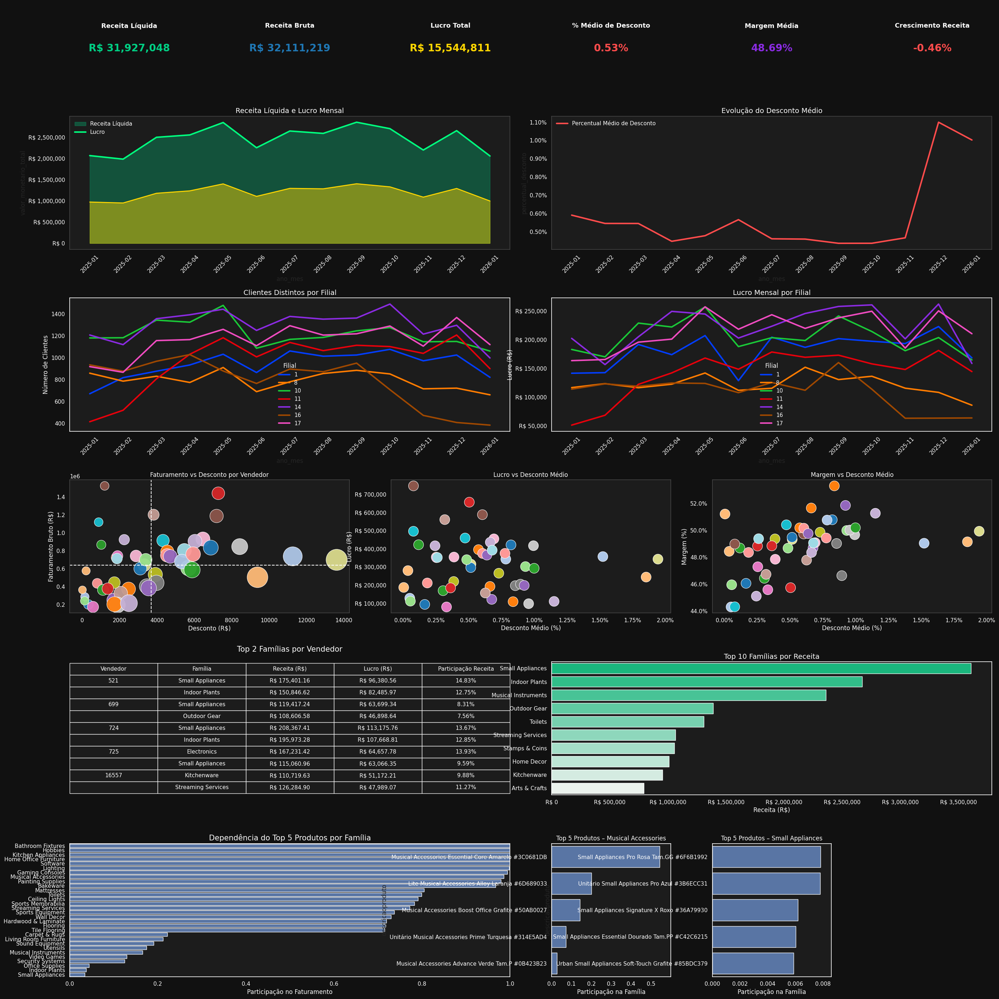

In [60]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as mtick
import pandas as pd
import numpy as np

# ===============================
# ESTILO GERAL
# ===============================
plt.style.use("dark_background")
sns.set_theme(style="dark")

# ===============================
# FIGURA PRINCIPAL
# ===============================
fig = plt.figure(figsize=(28, 28), facecolor="#111111")
gs = fig.add_gridspec(6, 6, height_ratios=[1.2, 2.5, 2.5, 2.5, 2.5, 2.5])

# ===============================
# KPI CARDS
# ===============================
kpis = [
    ("Receita Líquida", f"R$ {base['valor_monetario_total'].sum():,.0f}", "#00D084"),
    ("Receita Bruta", f"R$ {base['faturamento_bruto'].sum():,.0f}", "#1F77B4"),
    ("Lucro Total", f"R$ {base['lucro'].sum():,.0f}", "#FFD700"),
    ("% Médio de Desconto", f"{base['percentual_desconto'].mean():.2%}", "#FF4C4C"),
    ("Margem Média", f"{base['lucro'].sum()/base['valor_monetario_total'].sum():.2%}", "#8A2BE2"),
    ("Crescimento Receita", 
     f"{(mensal['valor_monetario_total'].iloc[-1]-mensal['valor_monetario_total'].iloc[0])/mensal['valor_monetario_total'].iloc[0]:.2%}", 
     "#00FF7F" if (mensal['valor_monetario_total'].iloc[-1]-mensal['valor_monetario_total'].iloc[0]) > 0 else "#FF4C4C")
]

for i, (titulo, valor, cor) in enumerate(kpis):
    ax = fig.add_subplot(gs[0, i])
    ax.set_facecolor("#1C1C1C")
    ax.axis("off")
    ax.text(0.5, 0.65, titulo, ha="center", va="center",
            fontsize=13, fontweight="bold", color="white")
    ax.text(0.5, 0.3, valor, ha="center", va="center",
            fontsize=20, fontweight="bold", color=cor)

# ===============================
# RECEITA LÍQUIDA vs LUCRO
# ===============================
ax1 = fig.add_subplot(gs[1, :3])
ax1.set_facecolor("#1C1C1C")

ax1.fill_between(mensal["ano_mes"], mensal["valor_monetario_total"], alpha=0.3, color="#00D084")
sns.lineplot(data=mensal, x="ano_mes", y="valor_monetario_total", ax=ax1, color="#00FF7F", linewidth=3)
ax1.fill_between(mensal["ano_mes"], mensal["lucro"], alpha=0.45, color="#FFD700")
sns.lineplot(data=mensal, x="ano_mes", y="lucro", ax=ax1, color="#FFD700", linewidth=2)

ax1.set_title("Receita Líquida e Lucro Mensal", fontsize=14, color="white")
ax1.tick_params(axis='x', rotation=45, colors="white")
ax1.tick_params(axis='y', colors="white")
ax1.legend(["Receita Líquida", "Lucro"], frameon=False, facecolor="#1C1C1C", edgecolor="#444444", labelcolor="white")
ax1.yaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
for spine in ax1.spines.values():
    spine.set_color("#444444")

# ===============================
# PERCENTUAL DE DESCONTO
# ===============================
ax2 = fig.add_subplot(gs[1, 3:])
ax2.set_facecolor("#1C1C1C")
sns.lineplot(data=mensal, x="ano_mes", y="percentual_desconto",
             ax=ax2, color="#FF4C4C", linewidth=3)
ax2.set_title("Evolução do Desconto Médio", fontsize=14, color="white")
ax2.tick_params(axis='x', rotation=45, colors="white")
ax2.tick_params(axis='y', colors="white")
ax2.legend(["Percentual Médio de Desconto"], frameon=False, facecolor="#1C1C1C", edgecolor="#444444", labelcolor="white")
ax2.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
for spine in ax2.spines.values():
    spine.set_color("#444444")

# ===============================
# CLIENTES DISTINTOS POR FILIAL
# ===============================
ax3 = fig.add_subplot(gs[2, :3])
ax3.set_facecolor("#1C1C1C")
sns.lineplot(data=filial_mensal, x="ano_mes", y="clientes_distintos",
             hue="filial_venda", palette=cores_filiais, linewidth=3, ax=ax3)
ax3.set_title("Clientes Distintos por Filial", fontsize=14, color="white")
ax3.tick_params(axis='x', rotation=45, colors="white")
ax3.tick_params(axis='y', colors="white")
ax3.set_ylabel("Número de Clientes", color="white")
leg1 = ax3.legend(title="Filial", frameon=False)
plt.setp(leg1.get_texts(), color='white')
plt.setp(leg1.get_title(), color='white')

# ===============================
# LUCRO MENSAL POR FILIAL
# ===============================
ax4 = fig.add_subplot(gs[2, 3:])
ax4.set_facecolor("#1C1C1C")
sns.lineplot(data=filial_mensal, x="ano_mes", y="lucro",
             hue="filial_venda", palette=cores_filiais, linewidth=3, ax=ax4)
ax4.set_title("Lucro Mensal por Filial", fontsize=14, color="white")
ax4.tick_params(axis='x', rotation=45, colors="white")
ax4.tick_params(axis='y', colors="white")
ax4.yaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
ax4.set_ylabel("Lucro (R$)", color="white")
leg2 = ax4.legend(title="Filial", frameon=False)
plt.setp(leg2.get_texts(), color='white')
plt.setp(leg2.get_title(), color='white')

# ===============================
# VENDEDORES – FATURAMENTO vs DESCONTO
# ===============================
ax5 = fig.add_subplot(gs[3, :2])
ax5.set_facecolor("#1C1C1C")
sns.scatterplot(data=resumo_vendedor, x="valor_desconto", y="faturamento_bruto",
                hue="codigo_vendedor", palette=mapa_cores,
                size="bubble_size", sizes=(250, 1800),
                edgecolor="white", linewidth=0.8, alpha=0.95, legend=False, ax=ax5)
ax5.axhline(resumo_vendedor["faturamento_bruto"].mean(), color="white", linestyle="--", linewidth=1.5)
ax5.axvline(resumo_vendedor["valor_desconto"].mean(), color="white", linestyle="--", linewidth=1.5)
ax5.set_title("Faturamento vs Desconto por Vendedor", color="white")
ax5.set_xlabel("Desconto (R$)", color="white")
ax5.set_ylabel("Faturamento Bruto (R$)", color="white")
ax5.tick_params(colors="white")
for spine in ax5.spines.values():
    spine.set_color("#444444")

# ===============================
# LUCRO vs % DESCONTO
# ===============================
ax6 = fig.add_subplot(gs[3, 2:4])
ax6.set_facecolor("#1C1C1C")
sns.scatterplot(data=resumo_vendedor, x="percentual_desconto_medio", y="lucro",
                hue="codigo_vendedor", palette=mapa_cores,
                s=400, edgecolor="white", linewidth=0.8, legend=False, ax=ax6)
ax6.set_title("Lucro vs Desconto Médio", color="white")
ax6.set_xlabel("Desconto Médio (%)", color="white")
ax6.set_ylabel("Lucro (R$)", color="white")
ax6.tick_params(colors="white")
ax6.xaxis.set_major_formatter(mtick.PercentFormatter(1.0))
ax6.yaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
for spine in ax6.spines.values():
    spine.set_color("#444444")

# ===============================
# MARGEM vs % DESCONTO
# ===============================
ax7 = fig.add_subplot(gs[3, 4:])
ax7.set_facecolor("#1C1C1C")
sns.scatterplot(data=resumo_vendedor, x="percentual_desconto_medio", y="margem",
                hue="codigo_vendedor", palette=mapa_cores,
                s=400, edgecolor="white", linewidth=0.8, legend=False, ax=ax7)
ax7.set_title("Margem vs Desconto Médio", color="white")
ax7.set_xlabel("Desconto Médio (%)", color="white")
ax7.set_ylabel("Margem (%)", color="white")
ax7.tick_params(colors="white")
ax7.xaxis.set_major_formatter(mtick.PercentFormatter(1.0))
ax7.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
for spine in ax7.spines.values():
    spine.set_color("#444444")

# ===============================
# TABELA TOP 2 FAMÍLIAS POR VENDEDOR
# ===============================
ax8 = fig.add_subplot(gs[4, :3])
ax8.axis('off')
ax8.set_facecolor("#1C1C1C")
top2_formatado = top2_familias.copy().sort_values(["codigo_vendedor","lucro"], ascending=[True,False]).reset_index(drop=True)
top2_formatado["codigo_vendedor"] = top2_formatado["codigo_vendedor"].astype(str)
for i in range(1,len(top2_formatado)):
    if top2_formatado.loc[i,"codigo_vendedor"] == top2_formatado.loc[i-1,"codigo_vendedor"]:
        top2_formatado.loc[i,"codigo_vendedor"] = ""
top2_formatado["valor_monetario_total"] = top2_formatado["valor_monetario_total"].map(lambda x: f"R$ {x:,.2f}")
top2_formatado["lucro"] = top2_formatado["lucro"].map(lambda x: f"R$ {x:,.2f}")
top2_formatado["participacao_receita"] = top2_formatado["participacao_receita"].map(lambda x: f"{x:.2%}")
top2_formatado.columns = ["Vendedor","Família","Receita (R$)","Lucro (R$)","Participação Receita"]
tabela = ax8.table(cellText=top2_formatado.values, colLabels=top2_formatado.columns,
                   cellLoc='center', loc='center')
tabela.auto_set_font_size(False)
tabela.set_fontsize(11)
tabela.scale(1,1.8)
for (row, col), cell in tabela.get_celld().items():
    cell.set_edgecolor("white")
    cell.set_facecolor("#1C1C1C")
    cell.get_text().set_color("white")
ax8.set_title("Top 2 Famílias por Vendedor", fontsize=15, color="white", pad=20)

# ===============================
# TOP 10 FAMÍLIAS POR RECEITA
# ===============================
ax9 = fig.add_subplot(gs[4, 3:])
ax9.set_facecolor("#1C1C1C")
familia_sorted = familia_receita.sort_values("valor_monetario_total", ascending=False).copy()
sns.barplot(data=familia_sorted.head(10), x="valor_monetario_total", y="descricaofamilia",
            palette=sns.light_palette("#00D084", n_colors=10, reverse=True), legend=False, ax=ax9)
ax9.set_title("Top 10 Famílias por Receita", fontsize=14, color="white")
ax9.set_xlabel("Receita (R$)", color="white")
ax9.set_ylabel("")
ax9.tick_params(colors="white")
ax9.xaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
for spine in ax9.spines.values():
    spine.set_color("white")

# ===============================
# DEPENDÊNCIA DO TOP 5 PRODUTOS POR FAMÍLIA
# ===============================
ax10 = fig.add_subplot(gs[5, :3])
ax10.set_facecolor("#1C1C1C")
sns.barplot(data=dependencia_plot, x="participacao_top5", y="descricaofamilia", ax=ax10)
ax10.set_title("Dependência do Top 5 Produtos por Família", fontsize=15, color="white")
ax10.set_xlabel("Participação no Faturamento", color="white")
ax10.set_ylabel("")
ax10.tick_params(colors="white")
ax10.set_xlim(0,1)
for spine in ax10.spines.values():
    spine.set_color("white")

# ===============================
# TOP 5 PRODUTOS – MUSICAL / SMALL APPLIANCES
# ===============================
ax11 = fig.add_subplot(gs[5, 3])
ax11.set_facecolor("#1C1C1C")
sns.barplot(data=musical, x="participacao_familia", y="descricaoproduto", ax=ax11)
ax11.set_title("Top 5 Produtos – Musical Accessories", color="white")
ax11.set_xlabel("Participação na Família", color="white")
ax11.tick_params(colors="white")
ax11.set_xlim(0, musical["participacao_familia"].max()*1.1)
for spine in ax11.spines.values():
    spine.set_color("white")

ax12 = fig.add_subplot(gs[5, 4])
ax12.set_facecolor("#1C1C1C")
sns.barplot(data=small_appliances, x="participacao_familia", y="descricaoproduto", ax=ax12)
ax12.set_title("Top 5 Produtos – Small Appliances", color="white")
ax12.set_xlabel("Participação na Família", color="white")
ax12.tick_params(colors="white")
ax12.set_xlim(0, small_appliances["participacao_familia"].max()*1.1)
for spine in ax12.spines.values():
    spine.set_color("white")

# ===============================
# AJUSTE FINAL DE LAYOUT
# ===============================
plt.tight_layout()
plt.subplots_adjust(hspace=0.4, wspace=0.35)
plt.show()


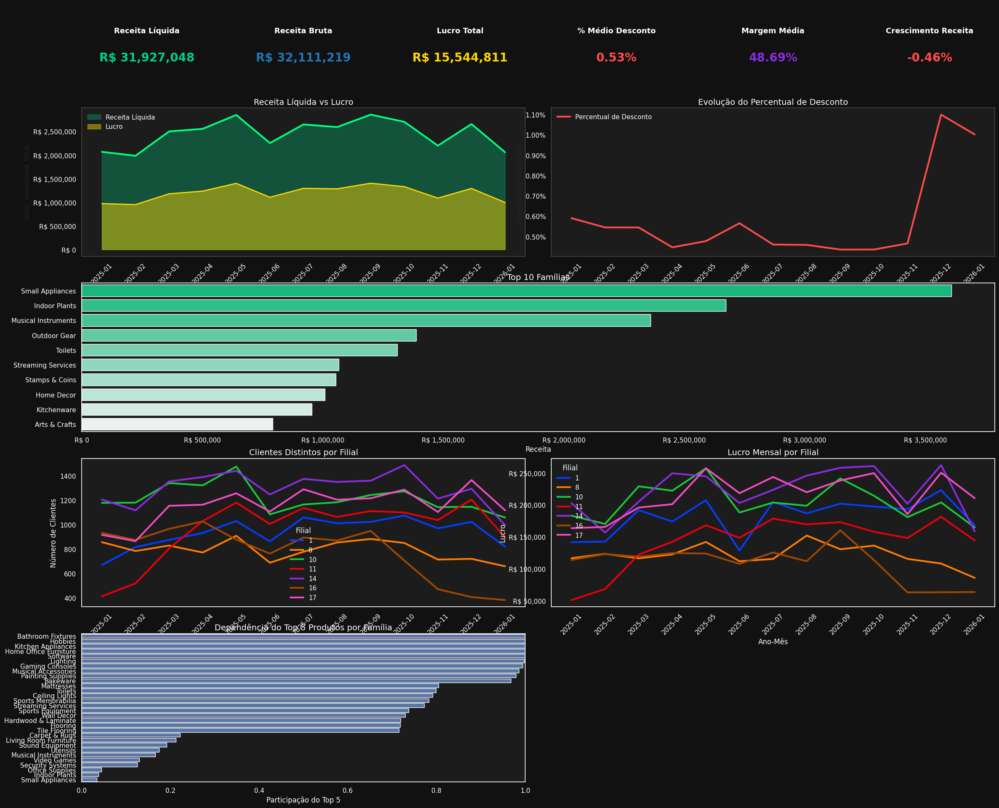

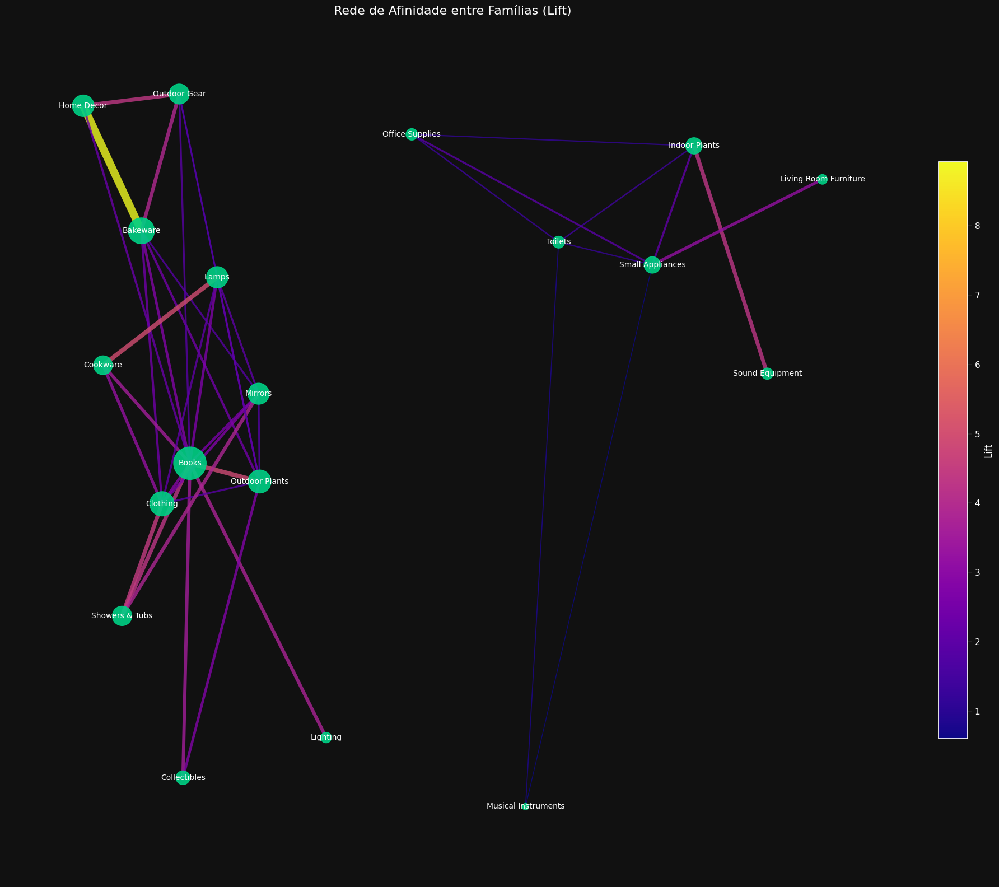

In [108]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as mtick
import pandas as pd
import numpy as np
import networkx as nx

# ===============================
# ESTILO GERAL
# ===============================
plt.style.use("dark_background")
sns.set_theme(style="dark")

# ===============================
# FIGURA PRINCIPAL – GRIDSPEC
# ===============================
fig = plt.figure(figsize=(28, 24), facecolor="#111111")

# Vamos dividir em 5 linhas para acomodar todas as seções
gs = fig.add_gridspec(5, 6, height_ratios=[1.3, 2.5, 2.5, 2.5, 2.5])

# ===============================
# 1️⃣ KPI CARDS
# ===============================
kpis = [
    ("Receita Líquida", f"R$ {base['valor_monetario_total'].sum():,.0f}", "#00D084"),
    ("Receita Bruta", f"R$ {base['faturamento_bruto'].sum():,.0f}", "#1F77B4"),
    ("Lucro Total", f"R$ {base['lucro'].sum():,.0f}", "#FFD700"),
    ("% Médio Desconto", f"{base['percentual_desconto'].mean():.2%}", "#FF4C4C"),
    ("Margem Média", f"{base['lucro'].sum()/base['valor_monetario_total'].sum():.2%}", "#8A2BE2"),
    ("Crescimento Receita",
     f"{(mensal['valor_monetario_total'].iloc[-1]-mensal['valor_monetario_total'].iloc[0])/mensal['valor_monetario_total'].iloc[0]:.2%}",
     "#00FF7F" if (mensal['valor_monetario_total'].iloc[-1]-mensal['valor_monetario_total'].iloc[0])>0 else "#FF4C4C")
]

for i, (titulo, valor, cor) in enumerate(kpis):
    ax = fig.add_subplot(gs[0, i])
    ax.set_facecolor("#1C1C1C")
    ax.axis("off")
    ax.text(0.5, 0.65, titulo, ha="center", va="center", fontsize=13, fontweight="bold", color="white")
    ax.text(0.5, 0.3, valor, ha="center", va="center", fontsize=20, fontweight="bold", color=cor)

# ===============================
# 2️⃣ RECEITA LÍQUIDA VS LUCRO
# ===============================
ax1 = fig.add_subplot(gs[1, :3])
ax1.set_facecolor("#1C1C1C")

ax1.fill_between(mensal["ano_mes"], mensal["valor_monetario_total"], alpha=0.3, color="#00D084", label="Receita Líquida")
sns.lineplot(data=mensal, x="ano_mes", y="valor_monetario_total", ax=ax1, color="#00FF7F", linewidth=3)
ax1.fill_between(mensal["ano_mes"], mensal["lucro"], color="#FFD700", alpha=0.45, label="Lucro")
sns.lineplot(data=mensal, x="ano_mes", y="lucro", ax=ax1, color="#FFD700", linewidth=2)

ax1.set_title("Receita Líquida vs Lucro", fontsize=14, color="white")
ax1.tick_params(axis='x', rotation=45, colors="white")
ax1.tick_params(axis='y', colors="white")
ax1.legend(frameon=False, facecolor="#1C1C1C", edgecolor="#444444", labelcolor="white")
for spine in ax1.spines.values(): spine.set_color("#444444")
ax1.yaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))

# ===============================
# 3️⃣ PERCENTUAL DE DESCONTO
# ===============================
ax2 = fig.add_subplot(gs[1, 3:])
ax2.set_facecolor("#1C1C1C")
sns.lineplot(data=mensal, x="ano_mes", y="percentual_desconto", ax=ax2, color="#FF4C4C", linewidth=3, label ="Percentual de Desconto")
ax2.set_title("Evolução do Percentual de Desconto", fontsize=14, color="white")
ax2.tick_params(axis='x', rotation=45, colors="white")
ax2.tick_params(axis='y', colors="white")
ax2.legend(frameon=False, facecolor="#1C1C1C", edgecolor="#444444", labelcolor="white")
for spine in ax2.spines.values(): spine.set_color("#444444")
ax2.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))

# ===============================
# 4️⃣ TOP 10 FAMÍLIAS
# ===============================
ax3 = fig.add_subplot(gs[2, :])
ax3.set_facecolor("#1C1C1C")
familia_sorted = familia_receita.sort_values("valor_monetario_total", ascending=False).copy()
sns.barplot(
    data=familia_sorted.head(10),
    x="valor_monetario_total",
    y="descricaofamilia",
    hue="descricaofamilia",
    palette=sns.light_palette("#00D084", n_colors=10, reverse=True),
    legend=False,
    ax=ax3
)
ax3.set_title("Top 10 Famílias", fontsize=14, color="white")
ax3.set_xlabel("Receita", color="white")
ax3.set_ylabel("")
ax3.tick_params(axis='x', colors="white")
ax3.tick_params(axis='y', colors="white")
ax3.xaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))

# ===============================
# 5️⃣ CLIENTES E LUCRO POR FILIAL
# ===============================
ax4 = fig.add_subplot(gs[3, :3])
ax4.set_facecolor("#1C1C1C")
sns.lineplot(data=filial_mensal, x="ano_mes", y="clientes_distintos", hue="filial_venda", palette=cores_filiais, linewidth=3, ax=ax4)
ax4.set_title("Clientes Distintos por Filial", fontsize=14, color="white")
ax4.tick_params(axis='x', rotation=45, colors="white")
ax4.tick_params(axis='y', colors="white")
ax4.set_xlabel("Ano-Mês", color="white")
ax4.set_ylabel("Número de Clientes", color="white")
leg1 = ax4.legend(title="Filial", frameon=False); plt.setp(leg1.get_texts(), color='white'); plt.setp(leg1.get_title(), color='white')

ax5 = fig.add_subplot(gs[3, 3:])
ax5.set_facecolor("#1C1C1C")
sns.lineplot(data=filial_mensal, x="ano_mes", y="lucro", hue="filial_venda", palette=cores_filiais, linewidth=3, ax=ax5)
ax5.set_title("Lucro Mensal por Filial", fontsize=14, color="white")
ax5.tick_params(axis='x', rotation=45, colors="white"); ax5.tick_params(axis='y', colors="white")
ax5.set_xlabel("Ano-Mês", color="white"); ax5.set_ylabel("Lucro", color="white")
ax5.yaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
leg2 = ax5.legend(title="Filial", frameon=False); plt.setp(leg2.get_texts(), color='white'); plt.setp(leg2.get_title(), color='white')

# ===============================
# 6️⃣ DEPENDÊNCIA TOP 5 PRODUTOS
# ===============================
ax6 = fig.add_subplot(gs[4, :3])
ax6.set_facecolor("#1C1C1C")

top5_dependencia_sorted = top5_dependencia.sort_values("participacao_top5", ascending=False)
n = len(top5_dependencia_sorted)
dependencia_plot = pd.concat([top5_dependencia_sorted.head(10), top5_dependencia_sorted.iloc[n//2 - 5 : n//2 + 5], top5_dependencia_sorted.tail(10)])

sns.barplot(data=dependencia_plot, x="participacao_top5", y="descricaofamilia", ax=ax6)
ax6.set_title("Dependência do Top 5 Produtos por Família", fontsize=14, color="white")
ax6.set_xlabel("Participação do Top 5", color="white"); ax6.set_ylabel("")
ax6.tick_params(colors="white"); ax6.set_xlim(0,1)
for spine in ax6.spines.values(): spine.set_color("white")

# ===============================
# 7️⃣ REDE DE LIFT ENTRE FAMÍLIAS
# ===============================
# Criar grafo
G = nx.Graph()
familias_unicas = pd.unique(lift_filtrado[['familia_1', 'familia_2']].values.ravel())
G.add_nodes_from(familias_unicas)
for _, row in lift_filtrado.iterrows(): G.add_edge(row["familia_1"], row["familia_2"], weight=row["lift"])

pos = nx.spring_layout(G, k=0.999, seed=42)
node_weights = {node: sum(d['weight'] for _,_,d in G.edges(node, data=True)) for node in G.nodes()}
node_sizes = [node_weights[n]*50 for n in G.nodes()]
edges = G.edges(data=True)
edge_weights = [d['weight'] for _,_,d in edges]
cmap = plt.cm.plasma; norm = plt.Normalize(min(edge_weights), max(edge_weights))
edge_colors = [cmap(norm(w)) for w in edge_weights]
min_width, max_width = 1,10; w_min, w_max = min(edge_weights), max(edge_weights)
edge_widths = [min_width + (w - w_min)/(w_max - w_min)*(max_width-min_width) for w in edge_weights]

# Plot grafo separado
fig_g, ax_g = plt.subplots(figsize=(18,16), facecolor="#111111")
ax_g.set_facecolor("#111111")
nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color="#00D084", alpha=0.9, ax=ax_g)
nx.draw_networkx_edges(G, pos, width=edge_widths, edge_color=edge_colors, alpha=0.8, ax=ax_g)
nx.draw_networkx_labels(G, pos, font_size=10, font_color="white", ax=ax_g)
ax_g.set_title("Rede de Afinidade entre Famílias (Lift)", fontsize=16, color="white")
ax_g.axis("off")
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax_g, fraction=0.03, pad=0.04)
cbar.set_label("Lift", color="white", fontsize=12)
plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color='white')

plt.tight_layout()
plt.show()


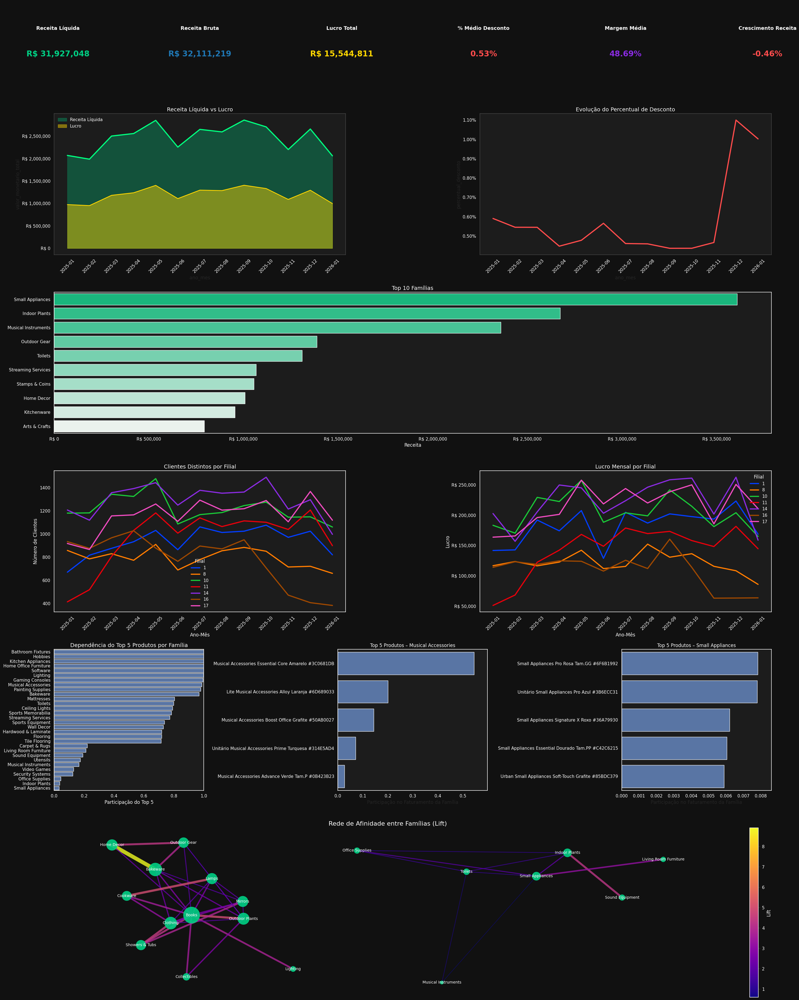

In [109]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as mtick
import pandas as pd
import numpy as np
import networkx as nx

# ===============================
# ESTILO GERAL
# ===============================
plt.style.use("dark_background")
sns.set_theme(style="dark")

# ===============================
# FIGURA PRINCIPAL – GRIDSPEC
# ===============================
fig = plt.figure(figsize=(28, 36), facecolor="#111111")

# Layout: 6 linhas
gs = fig.add_gridspec(6, 6, height_ratios=[1.3, 2.5, 2.5, 2.5, 2.5, 3])

# ===============================
# 1️⃣ KPI CARDS
# ===============================
kpis = [
    ("Receita Líquida", f"R$ {base['valor_monetario_total'].sum():,.0f}", "#00D084"),
    ("Receita Bruta", f"R$ {base['faturamento_bruto'].sum():,.0f}", "#1F77B4"),
    ("Lucro Total", f"R$ {base['lucro'].sum():,.0f}", "#FFD700"),
    ("% Médio Desconto", f"{base['percentual_desconto'].mean():.2%}", "#FF4C4C"),
    ("Margem Média", f"{base['lucro'].sum()/base['valor_monetario_total'].sum():.2%}", "#8A2BE2"),
    ("Crescimento Receita",
     f"{(mensal['valor_monetario_total'].iloc[-1]-mensal['valor_monetario_total'].iloc[0])/mensal['valor_monetario_total'].iloc[0]:.2%}",
     "#00FF7F" if (mensal['valor_monetario_total'].iloc[-1]-mensal['valor_monetario_total'].iloc[0])>0 else "#FF4C4C")
]

for i, (titulo, valor, cor) in enumerate(kpis):
    ax = fig.add_subplot(gs[0, i])
    ax.set_facecolor("#1C1C1C")
    ax.axis("off")
    ax.text(0.5, 0.65, titulo, ha="center", va="center", fontsize=13, fontweight="bold", color="white")
    ax.text(0.5, 0.3, valor, ha="center", va="center", fontsize=20, fontweight="bold", color=cor)

# ===============================
# 2️⃣ RECEITA LÍQUIDA VS LUCRO
# ===============================
ax1 = fig.add_subplot(gs[1, :3])
ax1.set_facecolor("#1C1C1C")
ax1.fill_between(mensal["ano_mes"], mensal["valor_monetario_total"], alpha=0.3, color="#00D084", label="Receita Líquida")
sns.lineplot(data=mensal, x="ano_mes", y="valor_monetario_total", ax=ax1, color="#00FF7F", linewidth=3)
ax1.fill_between(mensal["ano_mes"], mensal["lucro"], color="#FFD700", alpha=0.45, label="Lucro")
sns.lineplot(data=mensal, x="ano_mes", y="lucro", ax=ax1, color="#FFD700", linewidth=2)
ax1.set_title("Receita Líquida vs Lucro", fontsize=14, color="white")
ax1.tick_params(axis='x', rotation=45, colors="white"); ax1.tick_params(axis='y', colors="white")
ax1.legend(frameon=False, facecolor="#1C1C1C", edgecolor="#444444", labelcolor="white")
ax1.yaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
for spine in ax1.spines.values(): spine.set_color("#444444")

# ===============================
# 3️⃣ PERCENTUAL DE DESCONTO
# ===============================
ax2 = fig.add_subplot(gs[1, 3:])
ax2.set_facecolor("#1C1C1C")
sns.lineplot(data=mensal, x="ano_mes", y="percentual_desconto", ax=ax2, color="#FF4C4C", linewidth=3)
ax2.set_title("Evolução do Percentual de Desconto", fontsize=14, color="white")
ax2.tick_params(axis='x', rotation=45, colors="white"); ax2.tick_params(axis='y', colors="white")
ax2.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
for spine in ax2.spines.values(): spine.set_color("#444444")

# ===============================
# 4️⃣ TOP 10 FAMÍLIAS
# ===============================
ax3 = fig.add_subplot(gs[2, :])
ax3.set_facecolor("#1C1C1C")
familia_sorted = familia_receita.sort_values("valor_monetario_total", ascending=False).copy()
sns.barplot(
    data=familia_sorted.head(10),
    x="valor_monetario_total",
    y="descricaofamilia",
    hue="descricaofamilia",
    palette=sns.light_palette("#00D084", n_colors=10, reverse=True),
    legend=False,
    ax=ax3
)
ax3.set_title("Top 10 Famílias", fontsize=14, color="white")
ax3.set_xlabel("Receita", color="white"); ax3.set_ylabel("")
ax3.tick_params(axis='x', colors="white"); ax3.tick_params(axis='y', colors="white")
ax3.xaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))

# ===============================
# 5️⃣ CLIENTES E LUCRO POR FILIAL
# ===============================
ax4 = fig.add_subplot(gs[3, :3])
ax4.set_facecolor("#1C1C1C")
sns.lineplot(data=filial_mensal, x="ano_mes", y="clientes_distintos", hue="filial_venda", palette=cores_filiais, linewidth=3, ax=ax4)
ax4.set_title("Clientes Distintos por Filial", fontsize=14, color="white")
ax4.tick_params(axis='x', rotation=45, colors="white"); ax4.tick_params(axis='y', colors="white")
ax4.set_xlabel("Ano-Mês", color="white"); ax4.set_ylabel("Número de Clientes", color="white")
leg1 = ax4.legend(title="Filial", frameon=False); plt.setp(leg1.get_texts(), color='white'); plt.setp(leg1.get_title(), color='white')

ax5 = fig.add_subplot(gs[3, 3:])
ax5.set_facecolor("#1C1C1C")
sns.lineplot(data=filial_mensal, x="ano_mes", y="lucro", hue="filial_venda", palette=cores_filiais, linewidth=3, ax=ax5)
ax5.set_title("Lucro Mensal por Filial", fontsize=14, color="white")
ax5.tick_params(axis='x', rotation=45, colors="white"); ax5.tick_params(axis='y', colors="white")
ax5.set_xlabel("Ano-Mês", color="white"); ax5.set_ylabel("Lucro", color="white")
ax5.yaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
leg2 = ax5.legend(title="Filial", frameon=False); plt.setp(leg2.get_texts(), color='white'); plt.setp(leg2.get_title(), color='white')

# ===============================
# 6️⃣ DEPENDÊNCIA TOP 5 PRODUTOS POR FAMÍLIA
# ===============================
ax6 = fig.add_subplot(gs[4, :2])
ax6.set_facecolor("#1C1C1C")
top5_dependencia_sorted = top5_dependencia.sort_values("participacao_top5", ascending=False)
n = len(top5_dependencia_sorted)
dependencia_plot = pd.concat([top5_dependencia_sorted.head(10), top5_dependencia_sorted.iloc[n//2 - 5 : n//2 + 5], top5_dependencia_sorted.tail(10)])
sns.barplot(data=dependencia_plot, x="participacao_top5", y="descricaofamilia", ax=ax6)
ax6.set_title("Dependência do Top 5 Produtos por Família", fontsize=14, color="white")
ax6.set_xlabel("Participação do Top 5", color="white"); ax6.set_ylabel("")
ax6.tick_params(colors="white"); ax6.set_xlim(0,1)
for spine in ax6.spines.values(): spine.set_color("white")

# Top 5 Musical Accessories
ax7 = fig.add_subplot(gs[4, 2:4])
ax7.set_facecolor("#1C1C1C")
musical = top5_produtos_familia[top5_produtos_familia["descricaofamilia"]=="Musical Accessories"].sort_values("participacao_familia", ascending=False)
sns.barplot(data=musical, x="participacao_familia", y="descricaoproduto", ax=ax7)
ax7.set_title("Top 5 Produtos – Musical Accessories", color="white")
ax7.set_xlabel("Participação no Faturamento da Família"); ax7.set_ylabel("")
ax7.tick_params(colors="white"); ax7.set_xlim(0, musical["participacao_familia"].max()*1.1)
for spine in ax7.spines.values(): spine.set_color("white")

# Top 5 Small Appliances
ax8 = fig.add_subplot(gs[4, 4:])
ax8.set_facecolor("#1C1C1C")
small_appliances = top5_produtos_familia[top5_produtos_familia["descricaofamilia"]=="Small Appliances"].sort_values("participacao_familia", ascending=False)
sns.barplot(data=small_appliances, x="participacao_familia", y="descricaoproduto", ax=ax8)
ax8.set_title("Top 5 Produtos – Small Appliances", color="white")
ax8.set_xlabel("Participação no Faturamento da Família"); ax8.set_ylabel("")
ax8.tick_params(colors="white"); ax8.set_xlim(0, small_appliances["participacao_familia"].max()*1.1)
for spine in ax8.spines.values(): spine.set_color("white")

# ===============================
# 7️⃣ REDE DE LIFT ENTRE FAMÍLIAS (linha inteira)
# ===============================
ax9 = fig.add_subplot(gs[5, :])
ax9.set_facecolor("#111111")

# Criar grafo
G = nx.Graph()
familias_unicas = pd.unique(lift_filtrado[['familia_1', 'familia_2']].values.ravel())
G.add_nodes_from(familias_unicas)
for _, row in lift_filtrado.iterrows(): G.add_edge(row["familia_1"], row["familia_2"], weight=row["lift"])

pos = nx.spring_layout(G, k=0.999, seed=42)
node_weights = {node: sum(d['weight'] for _,_,d in G.edges(node, data=True)) for node in G.nodes()}
node_sizes = [node_weights[n]*50 for n in G.nodes()]
edges = G.edges(data=True)
edge_weights = [d['weight'] for _,_,d in edges]
cmap = plt.cm.plasma; norm = plt.Normalize(min(edge_weights), max(edge_weights))
edge_colors = [cmap(norm(w)) for w in edge_weights]
min_width, max_width = 1,10; w_min, w_max = min(edge_weights), max(edge_weights)
edge_widths = [min_width + (w - w_min)/(w_max - w_min)*(max_width-min_width) for w in edge_weights]

nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color="#00D084", alpha=0.9, ax=ax9)
nx.draw_networkx_edges(G, pos, width=edge_widths, edge_color=edge_colors, alpha=0.8, ax=ax9)
nx.draw_networkx_labels(G, pos, font_size=10, font_color="white", ax=ax9)
ax9.set_title("Rede de Afinidade entre Famílias (Lift)", fontsize=16, color="white")
ax9.axis("off")
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm); sm.set_array([])
cbar = plt.colorbar(sm, ax=ax9, fraction=0.03, pad=0.04)
cbar.set_label("Lift", color="white", fontsize=12); plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color='white')

plt.tight_layout()
plt.show()


/tmp/ipykernel_7731/3863100172.py:167: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  plt.tight_layout()


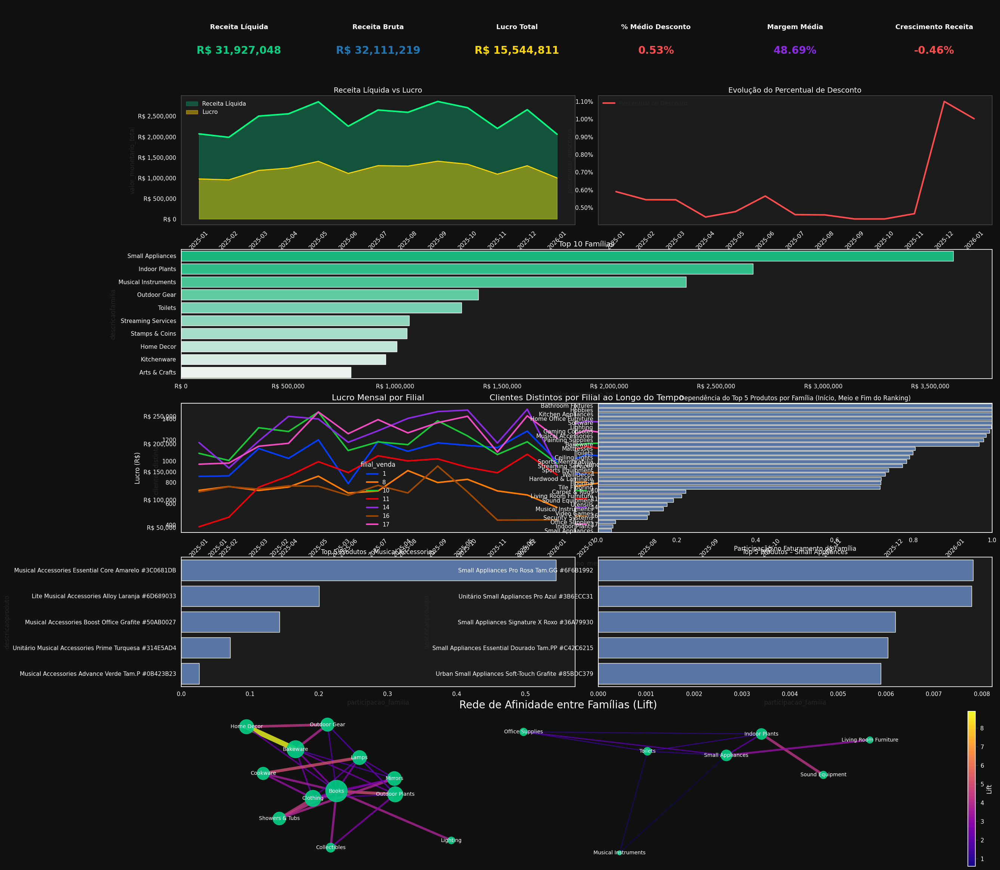

In [113]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as mtick
import networkx as nx

plt.style.use("dark_background")
sns.set_theme(style="dark")

# ===============================
# CONFIGURAÇÃO DA FIGURA UNIFICADA
# ===============================
fig = plt.figure(figsize=(28, 30), facecolor="#111111")  # figura maior
gs = fig.add_gridspec(
    6, 6,   # linhas x colunas
    height_ratios=[1.3, 2.5, 2.5, 2.5, 2.5, 3]  # ajuste para KPIs, gráficos, tabela, rede
)

# =====================================
# 1️⃣ KPI CARDS
# =====================================
kpis = [
    ("Receita Líquida", f"R$ {receita_total:,.0f}", "#00D084"),
    ("Receita Bruta", f"R$ {receita_bruta_total:,.0f}", "#1F77B4"),
    ("Lucro Total", f"R$ {lucro_total:,.0f}", "#FFD700"),
    ("% Médio Desconto", f"{percentual_desconto_medio:.2%}", "#FF4C4C"),
    ("Margem Média", f"{margem_media:.2%}", "#8A2BE2"),
    ("Crescimento Receita", f"{crescimento_receita:.2%}", "#00FF7F" if crescimento_receita > 0 else "#FF4C4C")
]

for i, (titulo, valor, cor) in enumerate(kpis):
    ax = fig.add_subplot(gs[0, i])
    ax.set_facecolor("#1C1C1C")
    ax.axis("off")
    ax.text(0.5, 0.65, titulo, ha="center", va="center", fontsize=13, fontweight="bold", color="white")
    ax.text(0.5, 0.3, valor, ha="center", va="center", fontsize=20, fontweight="bold", color=cor)

# =====================================
# 2️⃣ Receita vs Lucro
# =====================================
ax1 = fig.add_subplot(gs[1, :3])
ax1.set_facecolor("#1C1C1C")
ax1.fill_between(mensal["ano_mes"], mensal["valor_monetario_total"], alpha=0.3, color="#00D084", label="Receita Líquida")
sns.lineplot(data=mensal, x="ano_mes", y="valor_monetario_total", ax=ax1, color="#00FF7F", linewidth=3)
ax1.fill_between(mensal["ano_mes"], mensal["lucro"], color="#FFD700", alpha=0.45, label="Lucro")
sns.lineplot(data=mensal, x="ano_mes", y="lucro", ax=ax1, color="#FFD700", linewidth=2)
ax1.set_title("Receita Líquida vs Lucro", fontsize=14, color="white")
ax1.tick_params(axis='x', rotation=45, colors="white")
ax1.tick_params(axis='y', colors="white")
ax1.legend(frameon=False, facecolor="#1C1C1C", edgecolor="#444444", labelcolor="white")
ax1.yaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
for spine in ax1.spines.values(): spine.set_color("#444444")

# =====================================
# 3️⃣ Percentual de Desconto
# =====================================
ax2 = fig.add_subplot(gs[1, 3:])
ax2.set_facecolor("#1C1C1C")
sns.lineplot(data=mensal, x="ano_mes", y="percentual_desconto", ax=ax2, color="#FF4C4C", linewidth=3, label="Percentual de Desconto")
ax2.set_title("Evolução do Percentual de Desconto", fontsize=14, color="white")
ax2.tick_params(axis='x', rotation=45, colors="white")
ax2.tick_params(axis='y', colors="white")
ax2.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
for spine in ax2.spines.values(): spine.set_color("#444444")

# =====================================
# 4️⃣ Top 10 Famílias
# =====================================
ax3 = fig.add_subplot(gs[2, :])
ax3.set_facecolor("#1C1C1C")
familia_sorted = familia_receita.sort_values("valor_monetario_total", ascending=False).copy()
sns.barplot(data=familia_sorted.head(10), x="valor_monetario_total", y="descricaofamilia",
            hue="descricaofamilia", palette=sns.light_palette("#00D084", n_colors=10, reverse=True),
            legend=False, ax=ax3)
ax3.set_title("Top 10 Famílias", fontsize=14, color="white")
ax3.xaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
for spine in ax3.spines.values(): spine.set_color("white")
ax3.tick_params(colors="white")

# =====================================
# 5️⃣ Clientes por Filial
# =====================================
ax4 = fig.add_subplot(gs[3, :])
ax4.set_facecolor("#1C1C1C")
sns.lineplot(data=filial_mensal, x="ano_mes", y="clientes_distintos", hue="filial_venda", palette=cores_filiais, linewidth=3, ax=ax4)
ax4.set_title("Clientes Distintos por Filial ao Longo do Tempo", fontsize=16, color="white")
ax4.tick_params(axis='x', rotation=45, colors="white")
ax4.tick_params(axis='y', colors="white")
plt.setp(ax4.get_legend().get_texts(), color='white')
plt.setp(ax4.get_legend().get_title(), color='white')

# =====================================
# 5️⃣ Lucro Mensal por Filial
# =====================================
ax4b = fig.add_subplot(gs[3, :3])
ax4b.set_facecolor("#1C1C1C")
sns.lineplot(data=filial_mensal, x="ano_mes", y="lucro", hue="filial_venda", palette=cores_filiais, linewidth=3, ax=ax4b)
ax4b.set_title("Lucro Mensal por Filial", fontsize=16, color="white")
ax4b.tick_params(axis='x', rotation=45, colors="white")
ax4b.tick_params(axis='y', colors="white")
ax4b.set_ylabel("Lucro (R$)", color="white")
ax4b.set_xlabel("Ano-Mês", color="white")
ax4b.yaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
plt.setp(ax4b.get_legend().get_texts(), color='white')
plt.setp(ax4b.get_legend().get_title(), color='white')

# =====================================
# 6️⃣ Dependência Top 5 Produtos por Família
# =====================================
ax4c = fig.add_subplot(gs[3, 3:])
ax4c.set_facecolor("#1C1C1C")
sns.barplot(data=dependencia_plot, x="participacao_top5", y="descricaofamilia", ax=ax4c)
ax4c.set_title("Dependência do Top 5 Produtos por Família (Início, Meio e Fim do Ranking)", color="white")
ax4c.set_xlabel("Participação no Faturamento da Família", color="white")
ax4c.set_ylabel("")
ax4c.tick_params(colors="white")
ax4c.set_xlim(0, 1)
for spine in ax4c.spines.values():
    spine.set_color("white")


# =====================================
# 6️⃣ Top Produtos por Família (Dashboard 4)
# =====================================
ax5 = fig.add_subplot(gs[4, 0:3])
ax5.set_facecolor("#1C1C1C")
sns.barplot(data=musical, x="participacao_familia", y="descricaoproduto", ax=ax5)
ax5.set_title("Top 5 Produtos – Musical Accessories", color="white")
ax5.tick_params(colors="white")

ax6 = fig.add_subplot(gs[4, 3:])
ax6.set_facecolor("#1C1C1C")
sns.barplot(data=small_appliances, x="participacao_familia", y="descricaoproduto", ax=ax6)
ax6.set_title("Top 5 Produtos – Small Appliances", color="white")
ax6.tick_params(colors="white")

# =====================================
# 7️⃣ Rede de Lift
# =====================================
ax7 = fig.add_subplot(gs[5, :])
ax7.set_facecolor("#111111")
G = nx.Graph()
familias_unicas = pd.unique(lift_filtrado[['familia_1','familia_2']].values.ravel())
G.add_nodes_from(familias_unicas)
for _, row in lift_filtrado.iterrows(): G.add_edge(row["familia_1"], row["familia_2"], weight=row["lift"])
pos = nx.spring_layout(G, k=0.999, seed=42)
node_weights = {node: sum(d['weight'] for _,_,d in G.edges(node, data=True)) for node in G.nodes()}
node_sizes = [node_weights[n]*50 for n in G.nodes()]
edges = G.edges(data=True)
edge_weights = [d['weight'] for _,_,d in edges]
cmap = plt.cm.plasma
norm = plt.Normalize(min(edge_weights), max(edge_weights))
edge_colors = [cmap(norm(w)) for w in edge_weights]
min_width, max_width = 1, 10
w_min, w_max = min(edge_weights), max(edge_weights)
edge_widths = [min_width + (w - w_min)/(w_max - w_min)*(max_width-min_width) for w in edge_weights]
nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color="#00D084", alpha=0.9, ax=ax7)
nx.draw_networkx_edges(G, pos, width=edge_widths, edge_color=edge_colors, alpha=0.8, ax=ax7)
nx.draw_networkx_labels(G, pos, font_size=10, font_color="white", ax=ax7)
ax7.set_title("Rede de Afinidade entre Famílias (Lift)", fontsize=20, color="white")
ax7.axis("off")
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax7, fraction=0.03, pad=0.04)
cbar.set_label("Lift", color="white")
plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color='white')

plt.tight_layout()
plt.show()


/tmp/ipykernel_7731/2979767502.py:208: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


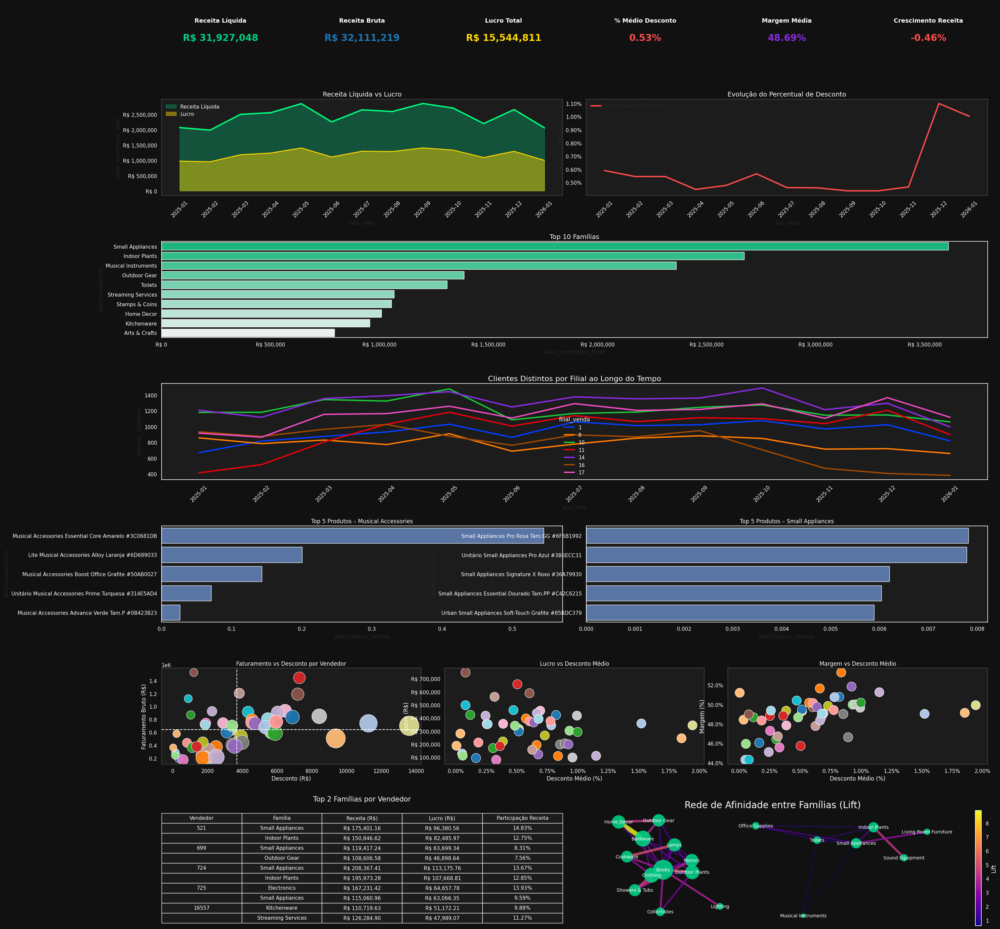

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as mtick
import networkx as nx

plt.style.use("dark_background")
sns.set_theme(style="dark")

# ===============================
# CONFIGURAÇÃO DA FIGURA UNIFICADA
# ===============================
fig = plt.figure(figsize=(32, 36), facecolor="#111111")
gs = fig.add_gridspec(
    7, 6,  # 7 linhas, 6 colunas
    height_ratios=[1.3, 2.5, 2.5, 2.5, 2.5, 2.5, 3], 
    hspace=0.5
)

# =====================================
# 1️⃣ KPI CARDS
# =====================================
kpis = [
    ("Receita Líquida", f"R$ {receita_total:,.0f}", "#00D084"),
    ("Receita Bruta", f"R$ {receita_bruta_total:,.0f}", "#1F77B4"),
    ("Lucro Total", f"R$ {lucro_total:,.0f}", "#FFD700"),
    ("% Médio Desconto", f"{percentual_desconto_medio:.2%}", "#FF4C4C"),
    ("Margem Média", f"{margem_media:.2%}", "#8A2BE2"),
    ("Crescimento Receita", f"{crescimento_receita:.2%}", "#00FF7F" if crescimento_receita > 0 else "#FF4C4C")
]

for i, (titulo, valor, cor) in enumerate(kpis):
    ax = fig.add_subplot(gs[0, i])
    ax.set_facecolor("#1C1C1C")
    ax.axis("off")
    ax.text(0.5, 0.65, titulo, ha="center", va="center", fontsize=13, fontweight="bold", color="white")
    ax.text(0.5, 0.3, valor, ha="center", va="center", fontsize=20, fontweight="bold", color=cor)

# =====================================
# 2️⃣ Receita vs Lucro
# =====================================
ax1 = fig.add_subplot(gs[1, :3])
ax1.set_facecolor("#1C1C1C")
ax1.fill_between(mensal["ano_mes"], mensal["valor_monetario_total"], alpha=0.3, color="#00D084", label="Receita Líquida")
sns.lineplot(data=mensal, x="ano_mes", y="valor_monetario_total", ax=ax1, color="#00FF7F", linewidth=3)
ax1.fill_between(mensal["ano_mes"], mensal["lucro"], color="#FFD700", alpha=0.45, label="Lucro")
sns.lineplot(data=mensal, x="ano_mes", y="lucro", ax=ax1, color="#FFD700", linewidth=2)
ax1.set_title("Receita Líquida vs Lucro", fontsize=14, color="white")
ax1.tick_params(axis='x', rotation=45, colors="white")
ax1.tick_params(axis='y', colors="white")
ax1.legend(frameon=False, facecolor="#1C1C1C", edgecolor="#444444", labelcolor="white")
ax1.yaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
for spine in ax1.spines.values(): spine.set_color("#444444")

# =====================================
# 3️⃣ Percentual de Desconto
# =====================================
ax2 = fig.add_subplot(gs[1, 3:])
ax2.set_facecolor("#1C1C1C")
sns.lineplot(data=mensal, x="ano_mes", y="percentual_desconto", ax=ax2, color="#FF4C4C", linewidth=3, label="Percentual de Desconto")
ax2.set_title("Evolução do Percentual de Desconto", fontsize=14, color="white")
ax2.tick_params(axis='x', rotation=45, colors="white")
ax2.tick_params(axis='y', colors="white")
ax2.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
for spine in ax2.spines.values(): spine.set_color("#444444")

# =====================================
# 4️⃣ Top 10 Famílias
# =====================================
ax3 = fig.add_subplot(gs[2, :])
ax3.set_facecolor("#1C1C1C")
familia_sorted = familia_receita.sort_values("valor_monetario_total", ascending=False).copy()
sns.barplot(data=familia_sorted.head(10), x="valor_monetario_total", y="descricaofamilia",
            hue="descricaofamilia", palette=sns.light_palette("#00D084", n_colors=10, reverse=True),
            legend=False, ax=ax3)
ax3.set_title("Top 10 Famílias", fontsize=14, color="white")
ax3.xaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
for spine in ax3.spines.values(): spine.set_color("white")
ax3.tick_params(colors="white")

# =====================================
# 5️⃣ Clientes por Filial
# =====================================
ax4 = fig.add_subplot(gs[3, :])
ax4.set_facecolor("#1C1C1C")
sns.lineplot(data=filial_mensal, x="ano_mes", y="clientes_distintos", hue="filial_venda", palette=cores_filiais, linewidth=3, ax=ax4)
ax4.set_title("Clientes Distintos por Filial ao Longo do Tempo", fontsize=16, color="white")
ax4.tick_params(axis='x', rotation=45, colors="white")
ax4.tick_params(axis='y', colors="white")
plt.setp(ax4.get_legend().get_texts(), color='white')
plt.setp(ax4.get_legend().get_title(), color='white')

# =====================================
# 6️⃣ Top Produtos por Família (Dashboard 4)
# =====================================
ax5 = fig.add_subplot(gs[4, 0:3])
ax5.set_facecolor("#1C1C1C")
sns.barplot(data=musical, x="participacao_familia", y="descricaoproduto", ax=ax5)
ax5.set_title("Top 5 Produtos – Musical Accessories", color="white")
ax5.tick_params(colors="white")

ax6 = fig.add_subplot(gs[4, 3:])
ax6.set_facecolor("#1C1C1C")
sns.barplot(data=small_appliances, x="participacao_familia", y="descricaoproduto", ax=ax6)
ax6.set_title("Top 5 Produtos – Small Appliances", color="white")
ax6.tick_params(colors="white")

# =====================================
# 7️⃣ VENDEDORES – FATURAMENTO, LUCRO, MARGEM, TABELA
# =====================================
# Faturamento vs Desconto
ax7 = fig.add_subplot(gs[5, :2])
ax7.set_facecolor("#1C1C1C")
sns.scatterplot(data=resumo_vendedor, x="valor_desconto", y="faturamento_bruto",
                hue="codigo_vendedor", palette=mapa_cores,
                size="bubble_size", sizes=(250, 1800),
                edgecolor="white", linewidth=0.8, alpha=0.95, legend=False, ax=ax7)
ax7.axhline(resumo_vendedor["faturamento_bruto"].mean(), color="white", linestyle="--", linewidth=1.5)
ax7.axvline(resumo_vendedor["valor_desconto"].mean(), color="white", linestyle="--", linewidth=1.5)
ax7.set_title("Faturamento vs Desconto por Vendedor", color="white")
ax7.set_xlabel("Desconto (R$)", color="white")
ax7.set_ylabel("Faturamento Bruto (R$)", color="white")
ax7.tick_params(colors="white")
for spine in ax7.spines.values(): spine.set_color("#444444")

# Lucro vs Desconto Médio
ax8 = fig.add_subplot(gs[5, 2:4])
ax8.set_facecolor("#1C1C1C")
sns.scatterplot(data=resumo_vendedor, x="percentual_desconto_medio", y="lucro",
                hue="codigo_vendedor", palette=mapa_cores,
                s=400, edgecolor="white", linewidth=0.8, legend=False, ax=ax8)
ax8.set_title("Lucro vs Desconto Médio", color="white")
ax8.set_xlabel("Desconto Médio (%)", color="white")
ax8.set_ylabel("Lucro (R$)", color="white")
ax8.tick_params(colors="white")
ax8.xaxis.set_major_formatter(mtick.PercentFormatter(1.0))
ax8.yaxis.set_major_formatter(mtick.StrMethodFormatter('R$ {x:,.0f}'))
for spine in ax8.spines.values(): spine.set_color("#444444")

# Margem vs Desconto Médio
ax9 = fig.add_subplot(gs[5, 4:])
ax9.set_facecolor("#1C1C1C")
sns.scatterplot(data=resumo_vendedor, x="percentual_desconto_medio", y="margem",
                hue="codigo_vendedor", palette=mapa_cores,
                s=400, edgecolor="white", linewidth=0.8, legend=False, ax=ax9)
ax9.set_title("Margem vs Desconto Médio", color="white")
ax9.set_xlabel("Desconto Médio (%)", color="white")
ax9.set_ylabel("Margem (%)", color="white")
ax9.tick_params(colors="white")
ax9.xaxis.set_major_formatter(mtick.PercentFormatter(1.0))
ax9.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
for spine in ax9.spines.values(): spine.set_color("#444444")

# Tabela Top 2 Famílias por vendedor
ax10 = fig.add_subplot(gs[6, :3])
ax10.axis('off')
ax10.set_facecolor("#1C1C1C")
top2_formatado = top2_familias.copy().sort_values(["codigo_vendedor","lucro"], ascending=[True,False]).reset_index(drop=True)
top2_formatado["codigo_vendedor"] = top2_formatado["codigo_vendedor"].astype(str)
for i in range(1,len(top2_formatado)):
    if top2_formatado.loc[i,"codigo_vendedor"] == top2_formatado.loc[i-1,"codigo_vendedor"]:
        top2_formatado.loc[i,"codigo_vendedor"] = ""
top2_formatado["valor_monetario_total"] = top2_formatado["valor_monetario_total"].map(lambda x: f"R$ {x:,.2f}")
top2_formatado["lucro"] = top2_formatado["lucro"].map(lambda x: f"R$ {x:,.2f}")
top2_formatado["participacao_receita"] = top2_formatado["participacao_receita"].map(lambda x: f"{x:.2%}")
top2_formatado.columns = ["Vendedor","Família","Receita (R$)","Lucro (R$)","Participação Receita"]
tabela = ax10.table(cellText=top2_formatado.values, colLabels=top2_formatado.columns,
                   cellLoc='center', loc='center')
tabela.auto_set_font_size(False)
tabela.set_fontsize(11)
tabela.scale(1,1.8)
for (row, col), cell in tabela.get_celld().items():
    cell.set_edgecolor("white")
    cell.set_facecolor("#1C1C1C")
    cell.get_text().set_color("white")
ax10.set_title("Top 2 Famílias por Vendedor", fontsize=15, color="white", pad=20)

# =====================================
# 8️⃣ Rede de Lift
# =====================================
ax11 = fig.add_subplot(gs[6, 3:])
ax11.set_facecolor("#111111")
G = nx.Graph()
familias_unicas = pd.unique(lift_filtrado[['familia_1','familia_2']].values.ravel())
G.add_nodes_from(familias_unicas)
for _, row in lift_filtrado.iterrows(): G.add_edge(row["familia_1"], row["familia_2"], weight=row["lift"])
pos = nx.spring_layout(G, k=0.999, seed=42)
node_weights = {node: sum(d['weight'] for _,_,d in G.edges(node, data=True)) for node in G.nodes()}
node_sizes = [node_weights[n]*50 for n in G.nodes()]
edges = G.edges(data=True)
edge_weights = [d['weight'] for _,_,d in edges]
cmap = plt.cm.plasma
norm = plt.Normalize(min(edge_weights), max(edge_weights))
edge_colors = [cmap(norm(w)) for w in edge_weights]
min_width, max_width = 1, 10
w_min, w_max = min(edge_weights), max(edge_weights)
edge_widths = [min_width + (w - w_min)/(w_max - w_min)*(max_width-min_width) for w in edge_weights]
nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color="#00D084", alpha=0.9, ax=ax11)
nx.draw_networkx_edges(G, pos, width=edge_widths, edge_color=edge_colors, alpha=0.8, ax=ax11)
nx.draw_networkx_labels(G, pos, font_size=10, font_color="white", ax=ax11)
ax11.set_title("Rede de Afinidade entre Famílias (Lift)", fontsize=20, color="white")
ax11.axis("off")
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax11, fraction=0.03, pad=0.04)
cbar.set_label("Lift", color="white")
plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color='white')

plt.tight_layout()
plt.show()
